# Strategic Bidding Analysis (Case: RTS)

In this analysis, we want to study an effective structure for PQ-Curves that helps us build optimal bidding strategies in electricity markets.

## Dependencies and Data Preparation

#### Packages and Diretory

In [1]:
#make sure it is in "GridAnalysis.jl" 
cd("../../../")

In [2]:
using Pkg
Pkg.activate("./examples/RTS/bid_analysis_RTS")

In [3]:
Pkg.instantiate()

In [4]:
using Logging 
Logging.disable_logging(Logging.Info) #script to disable info messages 
Logging.disable_logging(Logging.Warn) #script to disable warning messages

LogLevel(1001)

In [5]:
using Dates
using DataFrames
using GridAnalysis
using Gurobi
using PowerSystems
using PowerSimulations
using Test
using Measures
using Plots

const PSY = PowerSystems

PowerSystems

#### Getting the data

In [6]:
# set directory
rts_dir = download("https://github.com/GridMod/RTS-GMLC", "master", mktempdir())
# Or clone the directory and open as:
# for example: rts_dir = "/home/rafaela/Documents/PUC/LAMPS/github/RTS-GMLC"
rts_src_dir = joinpath(rts_dir, "RTS_Data", "SourceData")
rts_siip_dir = joinpath(rts_dir, "RTS_Data", "FormattedData", "SIIP");

#### Uploading Utils

Might not work if running lines manually 
(solution: edit to be the path for this examples directory for example: 'example_dir = "./examples/RTS/"')

In [7]:
example_dir = "./examples/RTS/"

include(joinpath(example_dir, "utils.jl")) # case utilities
include(joinpath(example_dir, "modify_RTS.jl")) # functions that modify the RTS problem

rts_modifier_function!

#### Data Prep and Build Market Simulator
define solvers for Unit Commitment (UC), Real Time (RT) and Economic Dispatch (ED)

In [8]:
solver_uc = optimizer_with_attributes(Gurobi.Optimizer)
solver_rt = optimizer_with_attributes(Gurobi.Optimizer)
solver_ed = optimizer_with_attributes(Gurobi.Optimizer)

MathOptInterface.OptimizerWithAttributes(Gurobi.Optimizer, Pair{MathOptInterface.AbstractOptimizerAttribute, Any}[])

## Define analysis to be done

In [9]:
Network = [DCPPowerModel, NFAPowerModel, CopperPlatePowerModel];
Ramp = [true]; 
Minimal_generation = [true]; 
Reserve = [true]; 
Offer_Bus = ["Austen", "Bloch", "Chifa"]; 
bidding_period = [collect(1:24)];

#### Create a DataFrame where each line represents one analysis 

In [10]:
df = DataFrame(Network = [], 
               Ramp = [],
               Minimal_generation = [],
               Reserve = [],
               Offer_Bus = [],
               bidding_period = []) 
# Gathers all case parameters combinations
for a in Network 
    for b in Ramp 
        for c in Minimal_generation 
            for d in Reserve
                for e in Offer_Bus
                    for f in bidding_period
                        new_data = DataFrame(Network = [Dict("DA"=>a, "RT"=>a)], 
                        Ramp = [Dict("DA"=>b, "RT"=>b)],
                        Minimal_generation = [Dict("DA"=>c, "RT"=>c)],
                        Reserve = [d],
                        Offer_Bus = [e],
                        bidding_period = [f])
                        append!(df, new_data)
                    end
                end
            end
        end
    end
end

# Add extra analysis
# In this case, we remove minimal generation and analyse for three buses
for i in Offer_Bus
    new_data_1 = DataFrame(Network = [Dict("DA"=>DCPPowerModel, "RT"=>DCPPowerModel)],
    Ramp = [Dict("DA"=>true, "RT"=>true)],
    Minimal_generation = [Dict("DA"=>false, "RT"=>false)],
    Reserve = [true],
    Offer_Bus = [i],
    bidding_period = [collect(1:24)])
    append!(df, new_data_1)
end

df[!,1:6]

,Network,Ramp
,Any,Any
1,"Dict(""RT""=>DCPPowerModel, ""DA""=>DCPPowerModel)","Dict(""RT""=>1, ""DA""=>1)"
2,"Dict(""RT""=>DCPPowerModel, ""DA""=>DCPPowerModel)","Dict(""RT""=>1, ""DA""=>1)"
3,"Dict(""RT""=>DCPPowerModel, ""DA""=>DCPPowerModel)","Dict(""RT""=>1, ""DA""=>1)"
4,"Dict(""RT""=>NFAPowerModel, ""DA""=>NFAPowerModel)","Dict(""RT""=>1, ""DA""=>1)"
5,"Dict(""RT""=>NFAPowerModel, ""DA""=>NFAPowerModel)","Dict(""RT""=>1, ""DA""=>1)"
6,"Dict(""RT""=>NFAPowerModel, ""DA""=>NFAPowerModel)","Dict(""RT""=>1, ""DA""=>1)"
7,"Dict(""RT""=>CopperPlatePowerModel, ""DA""=>CopperPlatePowerModel)","Dict(""RT""=>1, ""DA""=>1)"
8,"Dict(""RT""=>CopperPlatePowerModel, ""DA""=>CopperPlatePowerModel)","Dict(""RT""=>1, ""DA""=>1)"
9,"Dict(""RT""=>CopperPlatePowerModel, ""DA""=>CopperPlatePowerModel)","Dict(""RT""=>1, ""DA""=>1)"


#### Define range quota and period to be analysed

In [11]:
range_quota = Float64.(collect(0:1:4));
initial_time = Date("2020-09-01");
period_analysed = [5,16,19,21];
initial_bidding_time = DateTime("2020-09-01");
path = "results";

## Run all the simulations

In [12]:
lines=[1,2,3,4,5,6,7,8,9,10,11,12]
period_analysed=[[5],[16],[19],[21]] 

4-element Vector{Vector{Int64}}:
 [5]
 [16]
 [19]
 [21]

In [14]:
sys_DA, sys_rt = get_rts_sys(rts_src_dir, rts_siip_dir;)

(base_power=100.0
LoadZone(11.0, 4.33, 0.88)
LoadZone(21.0, 4.33, 0.88)
LoadZone(25.0, 3.09, 0.63)
LoadZone(32.0, 5.29, 1.08)
LoadZone(33.0, 3.7, 0.76)
LoadZone(16.0, 6.109999999999999, 1.23)
LoadZone(22.0, 5.29, 1.08)
LoadZone(34.0, 2.65, 0.54)
LoadZone(26.0, 6.109999999999999, 1.23)
LoadZone(24.0, 2.65, 0.54)

***Omitted 488 components***



InfrastructureSystems.TimeSeriesParameters(Millisecond(3600000), InfrastructureSystems.ForecastParameters(0, DateTime("0001-01-01T00:00:00"), Minute(0), 0)), base_power=100.0
LoadZone(11.0, 4.33, 0.88)
LoadZone(21.0, 4.33, 0.88)
LoadZone(25.0, 3.09, 0.63)
LoadZone(32.0, 5.29, 1.08)
LoadZone(33.0, 3.7, 0.76)
LoadZone(16.0, 6.109999999999999, 1.23)
LoadZone(22.0, 5.29, 1.08)
LoadZone(34.0, 2.65, 0.54)
LoadZone(26.0, 6.109999999999999, 1.23)
LoadZone(24.0, 2.65, 0.54)

***Omitted 486 components***



InfrastructureSystems.TimeSeriesParameters(Millisecond(300000), InfrastructureSystems.ForecastParameters(12, DateTime("2020-01-01T00:00:00"), Minute(15

In [15]:
bus_names_thermal = [get_name(get_bus(i)) for i in get_components(ThermalStandard,sys_rt)]
bus_names_renewable = [get_name(get_bus(i)) for i in get_components(RenewableDispatch,sys_rt)]
bus_names = vcat(bus_names_thermal, bus_names_renewable)
bus_names = sort(unique(bus_names))

41-element Vector{String}:
 "Abel"
 "Adams"
 "Adler"
 "Agricola"
 "Alder"
 "Arne"
 "Arthur"
 "Asser"
 "Astor"
 "Attar"
 "Attlee"
 "Aubrey"
 "Austen"
 ⋮
 "Cecil"
 "Chain"
 "Chase"
 "Chifa"
 "Chuhsi"
 "Clark"
 "Clay"
 "Clive"
 "Cobb"
 "Cole"
 "Comte"
 "Curie"

In [14]:
run_set_of_simulations(df, rts_src_dir, rts_siip_dir, example_dir, solver_uc, solver_ed, solver_rt,
    range_quota, initial_time, initial_bidding_time, path)

Progress: 100%|█████████████████████████████████████████| Time: 0:00:12
  Step:                  1
  problem:               RT
  Simulation Timestamp:  2020-09-01T23:45:00


### Generate graphics 

#### Generation stack virtual

In [13]:
graphic="plot_generation_stack_virtual"

plt_g_A=load_plot_set_of_simulations(
    df,  
    example_dir, 
    rts_src_dir,
    rts_siip_dir,
    solver_uc, 
    solver_ed, 
    solver_rt, 
    range_quota, 
    initial_time,
    lines,
    period_analysed,
    initial_bidding_time,
    path,
    graphic,
    true,
    ["Austen"],
)

plt_g_B=load_plot_set_of_simulations(
    df,  
    example_dir, 
    rts_src_dir,
    rts_siip_dir,
    solver_uc, 
    solver_ed, 
    solver_rt, 
    range_quota, 
    initial_time,
    lines,
    period_analysed,
    initial_bidding_time,
    path,
    graphic,
    true,
    ["Bloch"],
)

plt_g_C=load_plot_set_of_simulations(
    df,  
    example_dir, 
    rts_src_dir,
    rts_siip_dir,
    solver_uc, 
    solver_ed, 
    solver_rt, 
    range_quota, 
    initial_time,
    lines,
    period_analysed,
    initial_bidding_time,
    path,
    graphic,
    true,
    ["Chifa"],
)

12×4×2 Array{Any, 3}:
[:, :, 1] =
 Plot{Plots.GRBackend() n=1}  …  Plot{Plots.GRBackend() n=1}
 Plot{Plots.GRBackend() n=1}     Plot{Plots.GRBackend() n=1}
 Plot{Plots.GRBackend() n=2}     Plot{Plots.GRBackend() n=2}
 Plot{Plots.GRBackend() n=1}     Plot{Plots.GRBackend() n=1}
 Plot{Plots.GRBackend() n=1}     Plot{Plots.GRBackend() n=1}
 Plot{Plots.GRBackend() n=2}  …  Plot{Plots.GRBackend() n=2}
 Plot{Plots.GRBackend() n=1}     Plot{Plots.GRBackend() n=1}
 Plot{Plots.GRBackend() n=1}     Plot{Plots.GRBackend() n=1}
 Plot{Plots.GRBackend() n=2}     Plot{Plots.GRBackend() n=2}
 Plot{Plots.GRBackend() n=1}     Plot{Plots.GRBackend() n=1}
 Plot{Plots.GRBackend() n=1}  …  Plot{Plots.GRBackend() n=1}
 Plot{Plots.GRBackend() n=2}     Plot{Plots.GRBackend() n=2}

[:, :, 2] =
 Plot{Plots.GRBackend() n=1}  …  Plot{Plots.GRBackend() n=1}
 Plot{Plots.GRBackend() n=1}     Plot{Plots.GRBackend() n=1}
 Plot{Plots.GRBackend() n=1}     Plot{Plots.GRBackend() n=1}
 Plot{Plots.GRBackend() n=1}     Plot{

#### Revenue curves (renewable plus virtual)

In [14]:
graphic="plot_revenue_curves_renewable_plus_virtual"
plt_rv=load_plot_set_of_simulations(
    df,  
    example_dir, 
    rts_src_dir,
    rts_siip_dir,
    solver_uc, 
    solver_ed, 
    solver_rt, 
    range_quota, 
    initial_time,
    lines,
    period_analysed,
    initial_bidding_time,
    path,
    graphic,
    true,
)

12-element Vector{Any}:
 Plot{Plots.GRBackend() n=9}
 Plot{Plots.GRBackend() n=9}
 Plot{Plots.GRBackend() n=9}
 Plot{Plots.GRBackend() n=9}
 Plot{Plots.GRBackend() n=9}
 Plot{Plots.GRBackend() n=9}
 Plot{Plots.GRBackend() n=9}
 Plot{Plots.GRBackend() n=9}
 Plot{Plots.GRBackend() n=9}
 Plot{Plots.GRBackend() n=9}
 Plot{Plots.GRBackend() n=9}
 Plot{Plots.GRBackend() n=9}

#### Price curves

In [15]:
graphic="plot_price_curves"
plt_p_t=load_plot_set_of_simulations(
    df,  
    example_dir, 
    rts_src_dir,
    rts_siip_dir,
    solver_uc, 
    solver_ed, 
    solver_rt, 
    range_quota, 
    initial_time,
    lines,
    period_analysed,
    initial_bidding_time,
    path,
    graphic,
    true,
)
plt_p_f=load_plot_set_of_simulations(
    df,  
    example_dir, 
    rts_src_dir,
    rts_siip_dir,
    solver_uc, 
    solver_ed, 
    solver_rt, 
    range_quota, 
    initial_time,
    lines,
    period_analysed,
    initial_bidding_time,
    path,
    graphic,
    false,
)

12×4 Matrix{Any}:
 Plot{Plots.GRBackend() n=6}  …  Plot{Plots.GRBackend() n=6}
 Plot{Plots.GRBackend() n=6}     Plot{Plots.GRBackend() n=6}
 Plot{Plots.GRBackend() n=6}     Plot{Plots.GRBackend() n=6}
 Plot{Plots.GRBackend() n=6}     Plot{Plots.GRBackend() n=6}
 Plot{Plots.GRBackend() n=6}     Plot{Plots.GRBackend() n=6}
 Plot{Plots.GRBackend() n=6}  …  Plot{Plots.GRBackend() n=6}
 Plot{Plots.GRBackend() n=6}     Plot{Plots.GRBackend() n=6}
 Plot{Plots.GRBackend() n=6}     Plot{Plots.GRBackend() n=6}
 Plot{Plots.GRBackend() n=6}     Plot{Plots.GRBackend() n=6}
 Plot{Plots.GRBackend() n=6}     Plot{Plots.GRBackend() n=6}
 Plot{Plots.GRBackend() n=6}  …  Plot{Plots.GRBackend() n=6}
 Plot{Plots.GRBackend() n=6}     Plot{Plots.GRBackend() n=6}

#### Sum of virtual revenue curves 

In [16]:
graphic="plot_sum_revenue_curves"
sum_periods=[collect(1:24)]
plt_sr=load_plot_set_of_simulations(
    df,
    example_dir,
    rts_src_dir,
    rts_siip_dir,
    solver_uc,
    solver_ed,
    solver_rt,
    range_quota,
    initial_time,
    lines,
    period_analysed,
    initial_bidding_time,
    path,
    graphic,
    true,
)

plt_sr_f=load_plot_set_of_simulations(
    df,
    example_dir,
    rts_src_dir,
    rts_siip_dir,
    solver_uc,
    solver_ed,
    solver_rt,
    range_quota,
    initial_time,
    lines,
    period_analysed,
    initial_bidding_time,
    path,
    graphic,
    false,
)

12-element Vector{Any}:
 Plot{Plots.GRBackend() n=1}
 Plot{Plots.GRBackend() n=1}
 Plot{Plots.GRBackend() n=1}
 Plot{Plots.GRBackend() n=1}
 Plot{Plots.GRBackend() n=1}
 Plot{Plots.GRBackend() n=1}
 Plot{Plots.GRBackend() n=1}
 Plot{Plots.GRBackend() n=1}
 Plot{Plots.GRBackend() n=1}
 Plot{Plots.GRBackend() n=1}
 Plot{Plots.GRBackend() n=1}
 Plot{Plots.GRBackend() n=1}

## Network analysis

### CASE1: DC

In [25]:
df[1:3,:]

,Network,Ramp,Minimal_generation
,Any,Any,Any
1,"Dict(""RT""=>DCPPowerModel, ""DA""=>DCPPowerModel)","Dict(""RT""=>1, ""DA""=>1)","Dict(""RT""=>1, ""DA""=>1)"
2,"Dict(""RT""=>DCPPowerModel, ""DA""=>DCPPowerModel)","Dict(""RT""=>1, ""DA""=>1)","Dict(""RT""=>1, ""DA""=>1)"
3,"Dict(""RT""=>DCPPowerModel, ""DA""=>DCPPowerModel)","Dict(""RT""=>1, ""DA""=>1)","Dict(""RT""=>1, ""DA""=>1)"


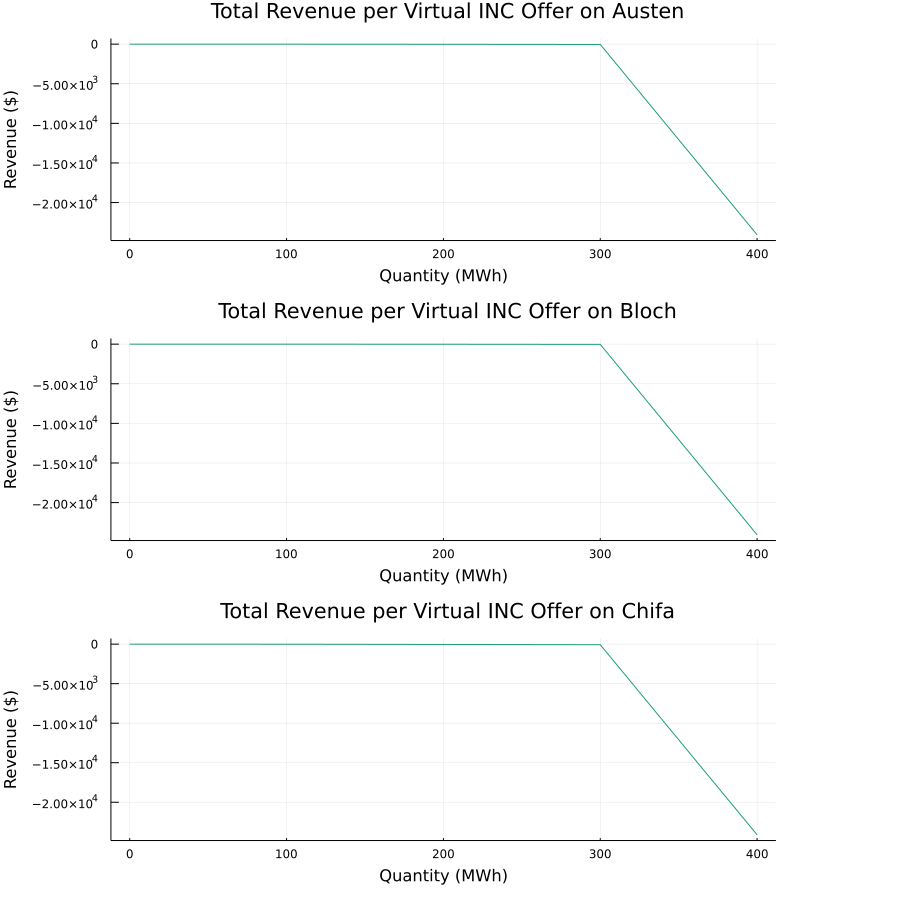

In [25]:
l = @layout grid(3,1)
plot(plt_sr_f[1], plt_sr_f[2], plt_sr_f[3], layout=l,size=(900,900))

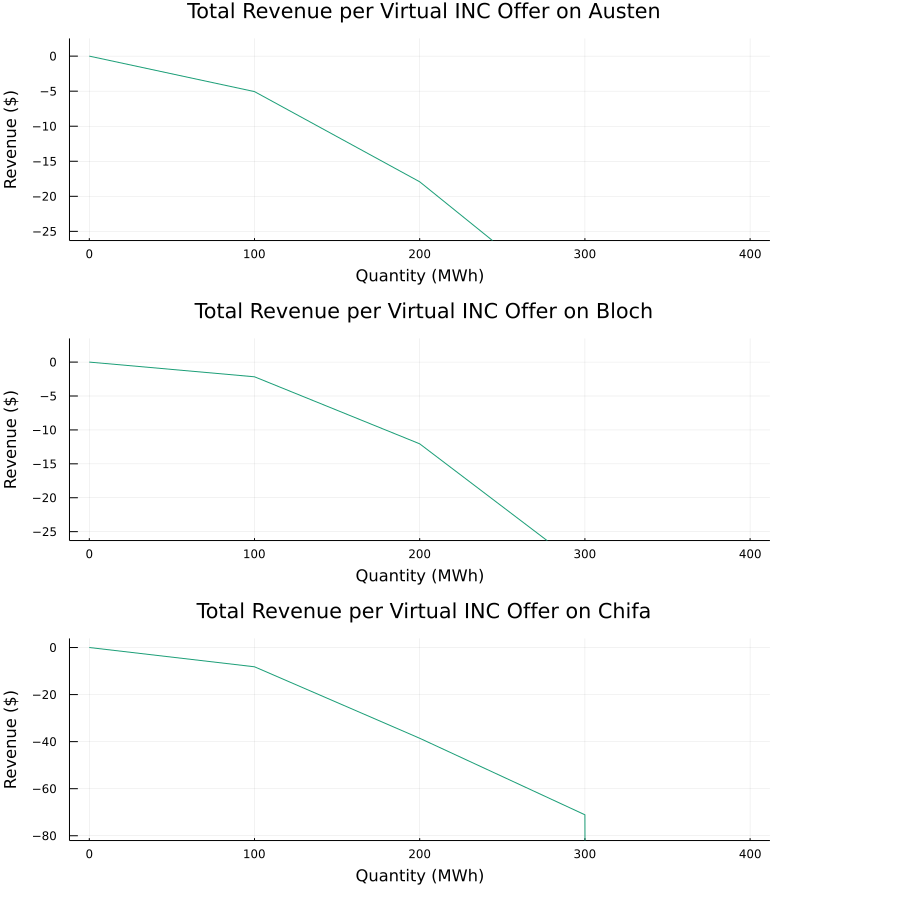

In [26]:
l = @layout grid(3,1)
plot(plt_sr[1], plt_sr[2], plt_sr[3], layout=l,size=(900,900))

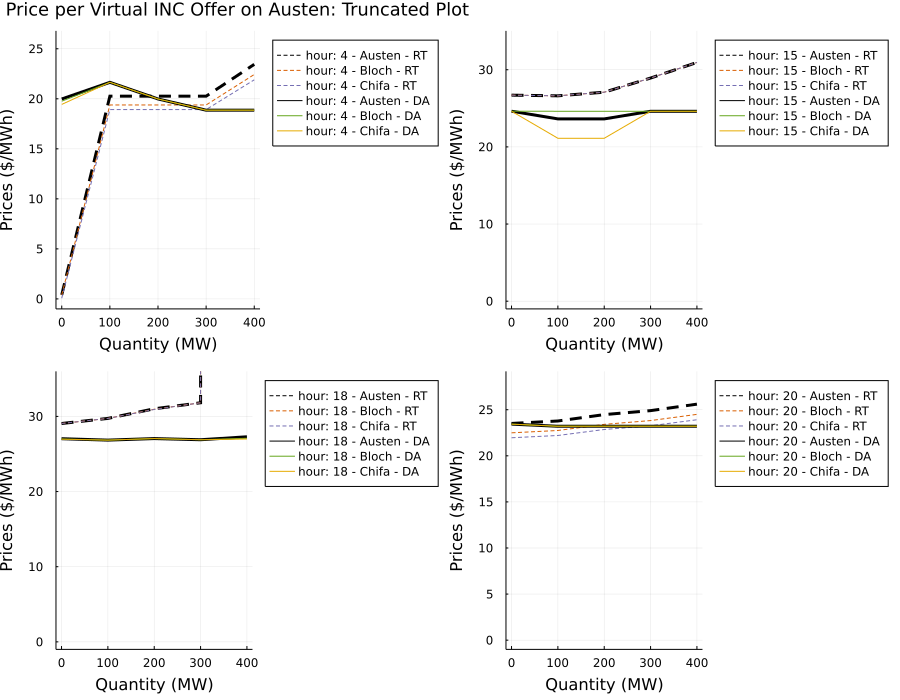

In [27]:
l = @layout grid(2,2)

plot(plt_p_t[1,1],plt_p_t[1,2],plt_p_t[1,3],plt_p_t[1,4],layout=l,size=(900,700),title=title=["                            Price per Virtual INC Offer on Austen: Truncated Plot" "" "" ""], titlefont = font(12)) 

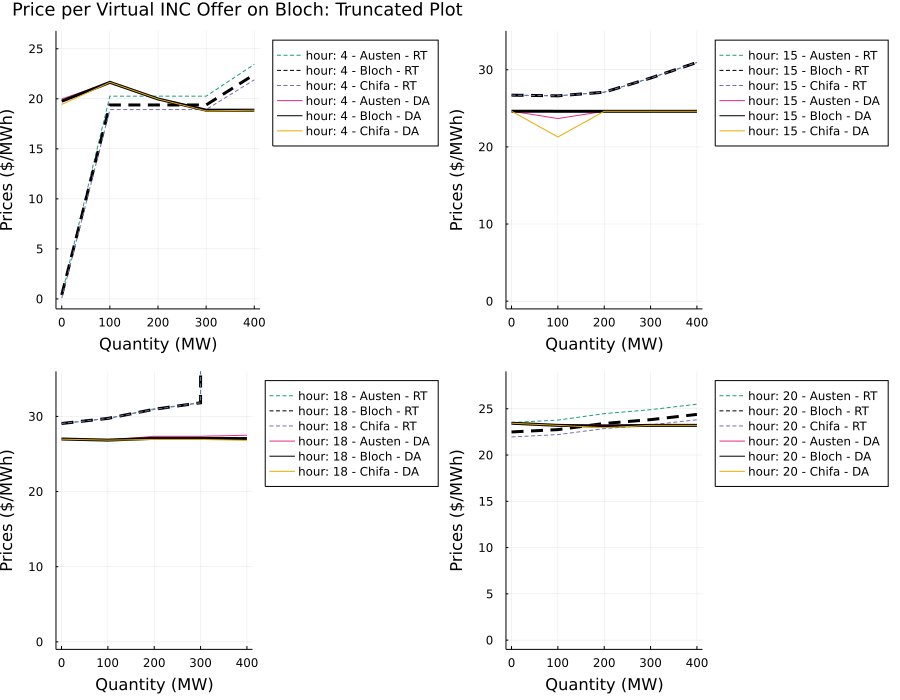

In [28]:
l = @layout grid(2,2)

plot(plt_p_t[2,1],plt_p_t[2,2],plt_p_t[2,3],plt_p_t[2,4],layout=l,size=(900,700),title=title=["                            Price per Virtual INC Offer on Bloch: Truncated Plot" "" "" ""], titlefont = font(12)) 

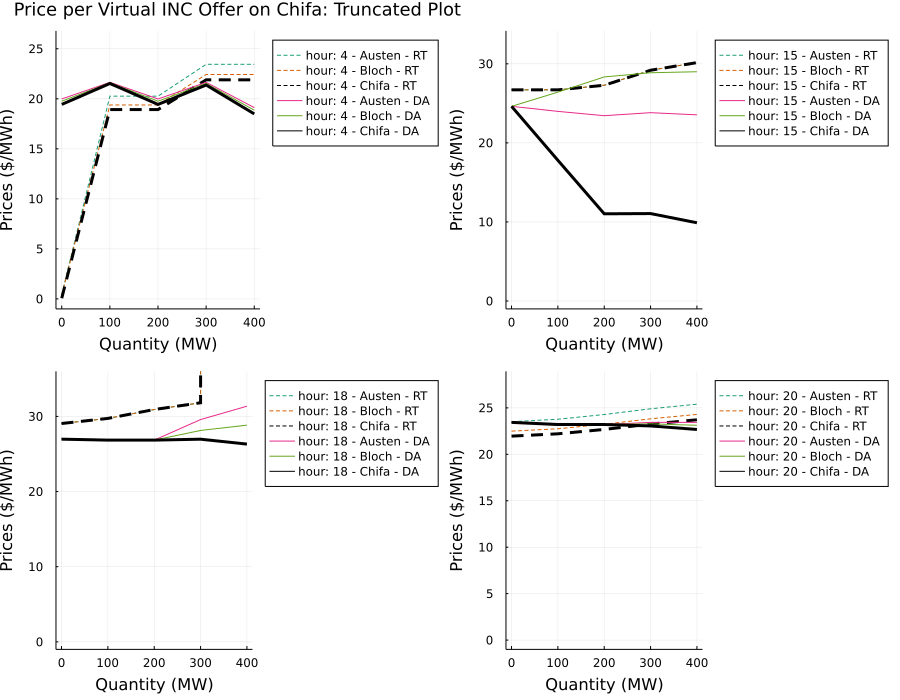

In [29]:
l = @layout grid(2,2)

plot(plt_p_t[3,1],plt_p_t[3,2],plt_p_t[3,3],plt_p_t[3,4],layout=l,size=(900,700),title=title=["                            Price per Virtual INC Offer on Chifa: Truncated Plot" "" "" ""], titlefont = font(12)) 

#### Generation in Austen when bidding in Austen

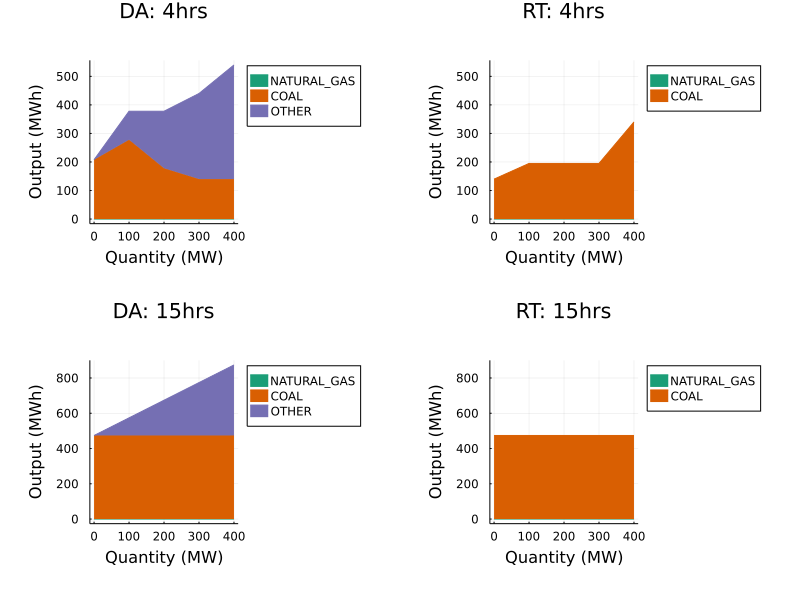

In [19]:
plot(plt_g_A[1,1,1], plt_g_A[1,1,2],plt_g_A[1,2,1], plt_g_A[1,2,2],layout=4,title=["DA: 4hrs" "RT: 4hrs" "DA: 15hrs" "RT: 15hrs"], link=:y, xtickfontsize=8, margin=8mm, size=(800, 600),)

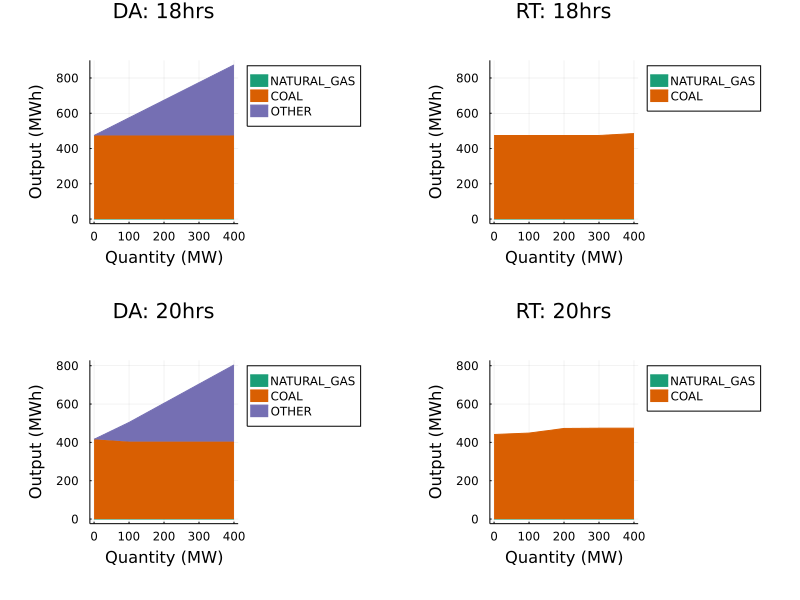

In [20]:
plot(plt_g_A[1,3,1], plt_g_A[1,3,2],plt_g_A[1,4,1], plt_g_A[1,4,2],layout=4,title=["DA: 18hrs" "RT: 18hrs" "DA: 20hrs" "RT: 20hrs"], link=:y, xtickfontsize=8, margin=8mm, size=(800, 600),)

#### Generation in Bloch when bidding in Bloch

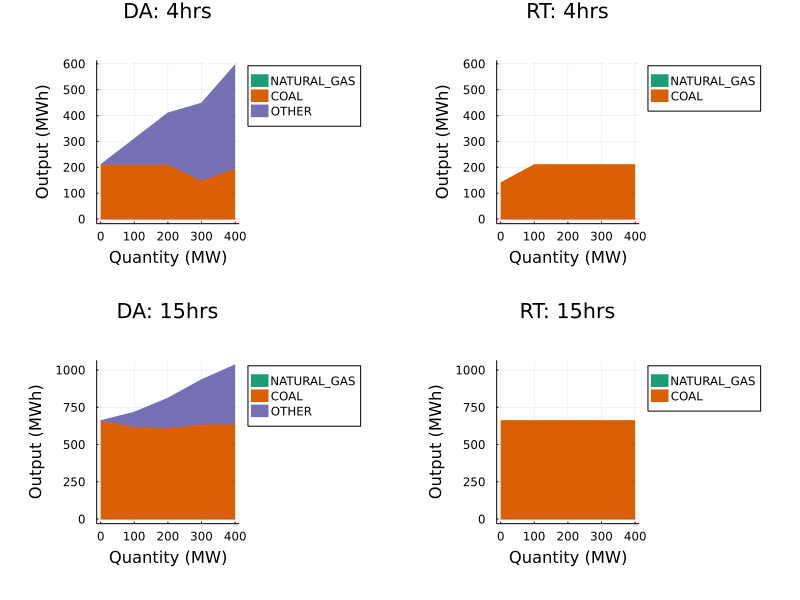

In [21]:
plot(plt_g_B[2,1,1], plt_g_B[2,1,2],plt_g_B[2,2,1], plt_g_B[2,2,2],layout=4,title=["DA: 4hrs" "RT: 4hrs" "DA: 15hrs" "RT: 15hrs"], link=:y, xtickfontsize=8, margin=8mm, size=(800, 600),)

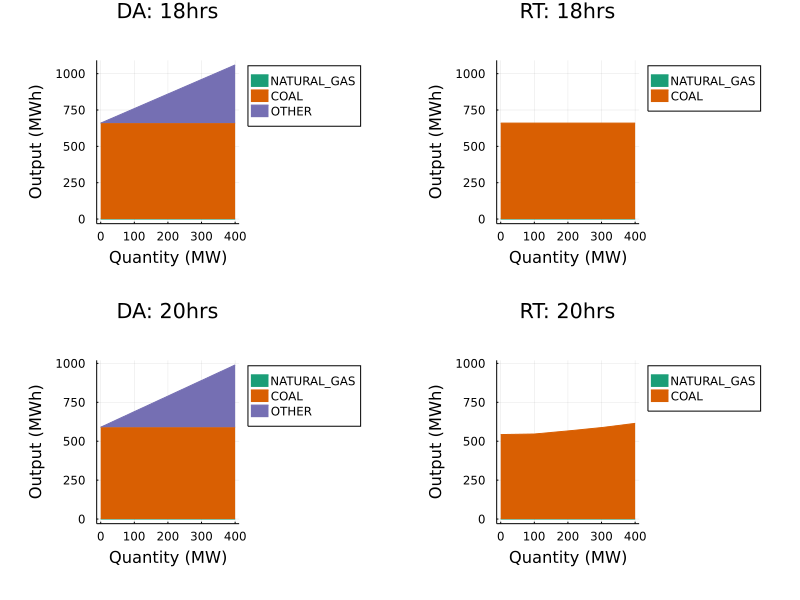

In [22]:
plot(plt_g_B[2,3,1], plt_g_B[2,3,2],plt_g_B[2,4,1], plt_g_B[2,4,2],layout=4,title=["DA: 18hrs" "RT: 18hrs" "DA: 20hrs" "RT: 20hrs"], link=:y, xtickfontsize=8, margin=8mm, size=(800, 600),)

#### Generation in Chifa when bidding in Chifa

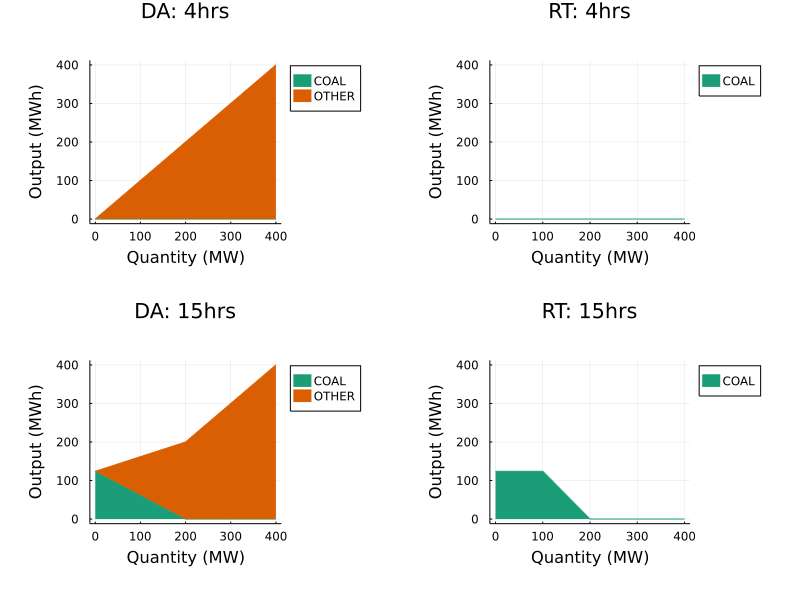

In [23]:
plot(plt_g_C[3,1,1], plt_g_C[3,1,2], plt_g_C[3,2,1], plt_g_C[3,2,2],layout=4,title=["DA: 4hrs" "RT: 4hrs" "DA: 15hrs" "RT: 15hrs"], link=:y, xtickfontsize=8, margin=8mm, size=(800, 600),)

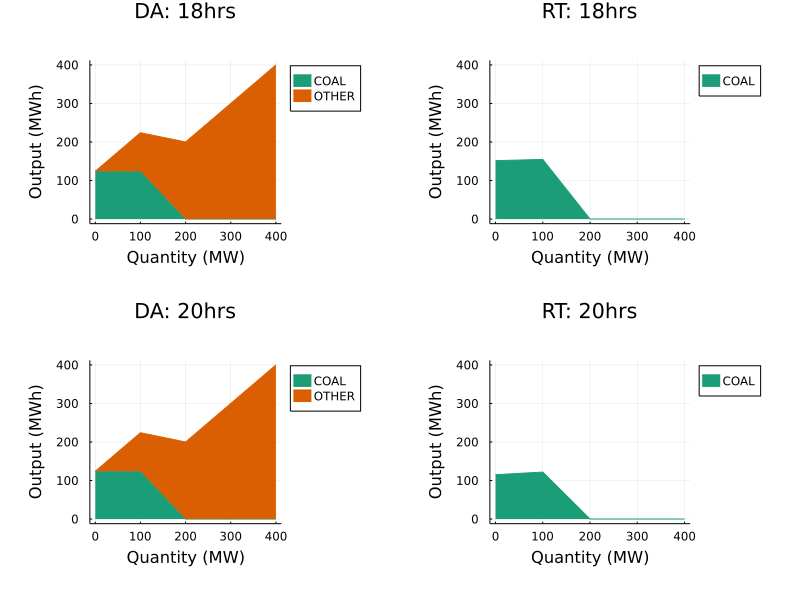

In [24]:
plot(plt_g_C[3,3,1], plt_g_C[3,3,2], plt_g_C[3,4,1], plt_g_C[3,4,2],layout=4,title=["DA: 18hrs" "RT: 18hrs" "DA: 20hrs" "RT: 20hrs"], link=:y, xtickfontsize=8, margin=8mm, size=(800, 600),)

### CASE2: NFA 

In [37]:
df[4:6,:]

,Network,Ramp,Minimal_generation
,Any,Any,Any
1,"Dict(""RT""=>NFAPowerModel, ""DA""=>NFAPowerModel)","Dict(""RT""=>1, ""DA""=>1)","Dict(""RT""=>1, ""DA""=>1)"
2,"Dict(""RT""=>NFAPowerModel, ""DA""=>NFAPowerModel)","Dict(""RT""=>1, ""DA""=>1)","Dict(""RT""=>1, ""DA""=>1)"
3,"Dict(""RT""=>NFAPowerModel, ""DA""=>NFAPowerModel)","Dict(""RT""=>1, ""DA""=>1)","Dict(""RT""=>1, ""DA""=>1)"


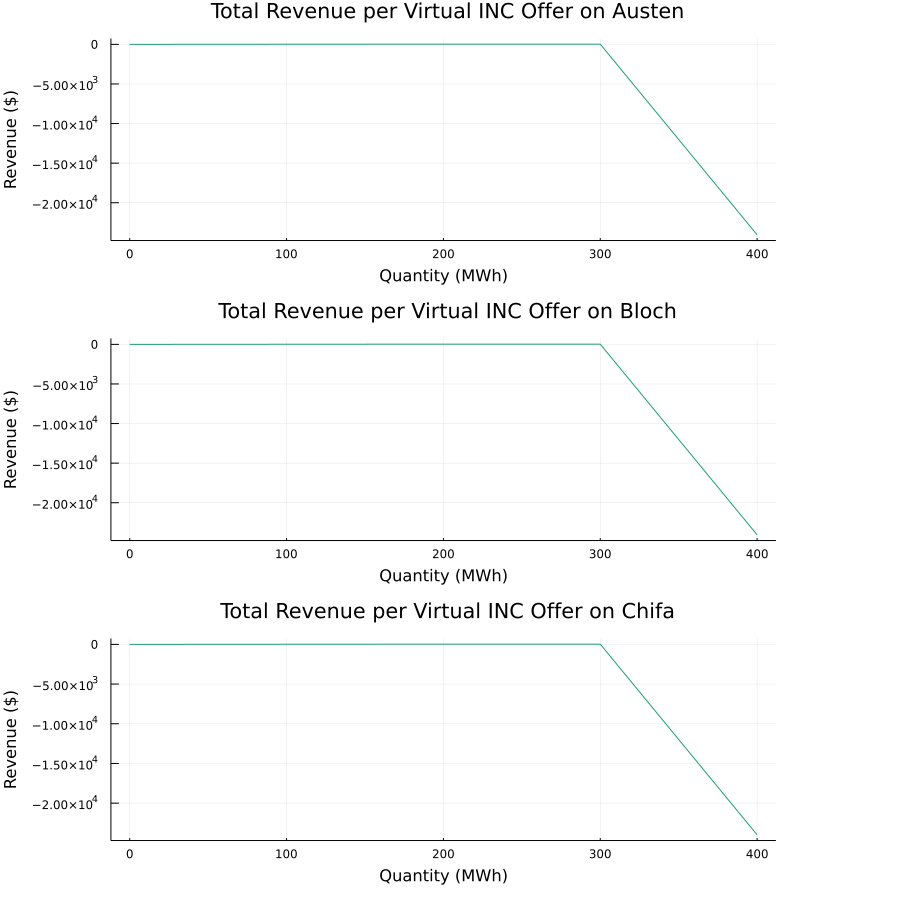

In [30]:
l = @layout grid(3,1)
plot(plt_sr_f[4], plt_sr_f[5], plt_sr_f[6], layout=l,size=(900,900))

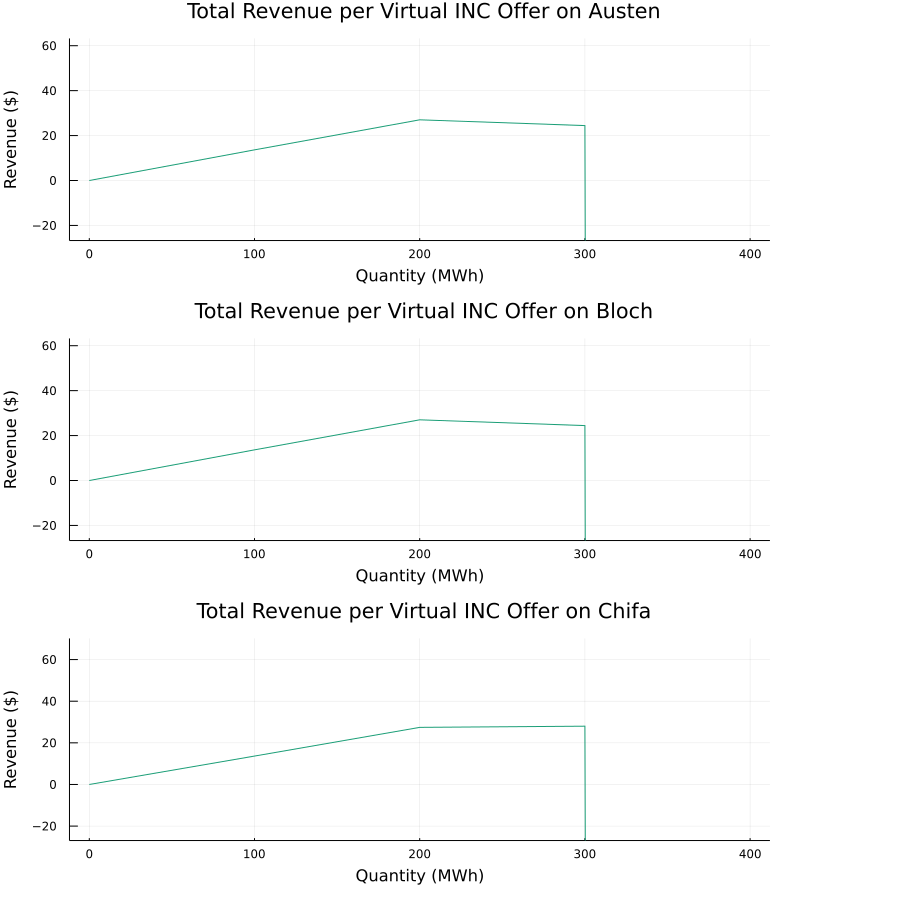

In [31]:
l = @layout grid(3,1)
plot(plt_sr[4], plt_sr[5], plt_sr[6], layout=l,size=(900,900))

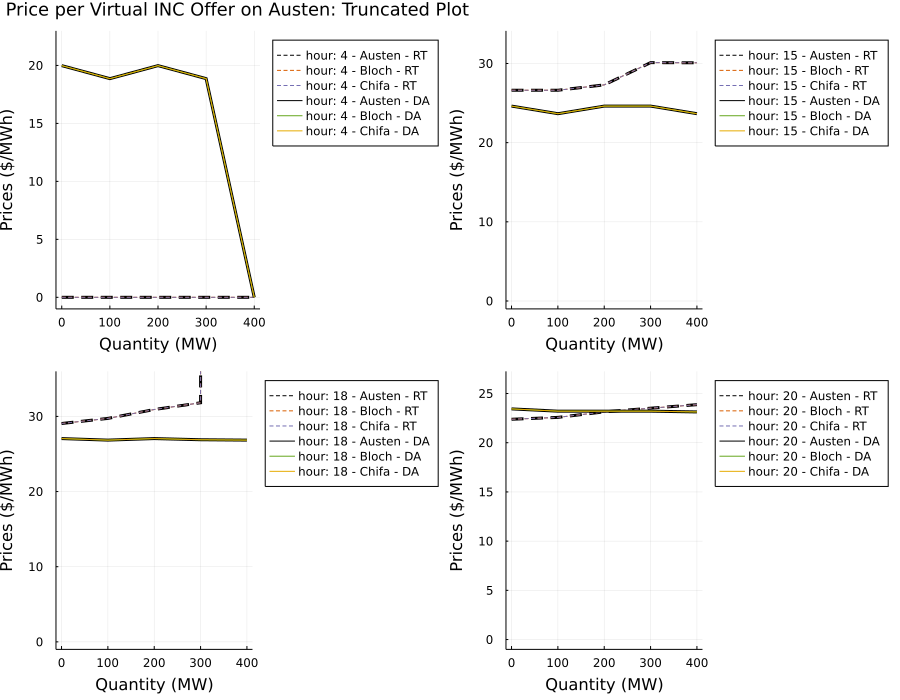

In [32]:
l = @layout grid(2,2)

plot(plt_p_t[4,1],plt_p_t[4,2],plt_p_t[4,3],plt_p_t[4,4],layout=l,size=(900,700),title=title=["                            Price per Virtual INC Offer on Austen: Truncated Plot" "" "" ""], titlefont = font(12)) 

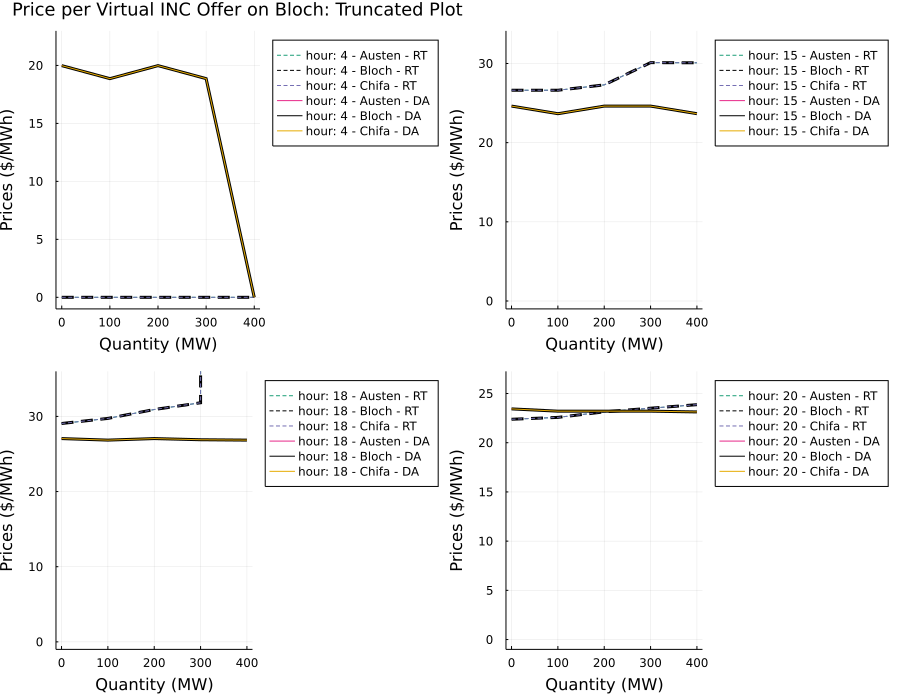

In [33]:
l = @layout grid(2,2)

plot(plt_p_t[5,1],plt_p_t[5,2],plt_p_t[5,3],plt_p_t[5,4],layout=l,size=(900,700),title=title=["                            Price per Virtual INC Offer on Bloch: Truncated Plot" "" "" ""], titlefont = font(12)) 

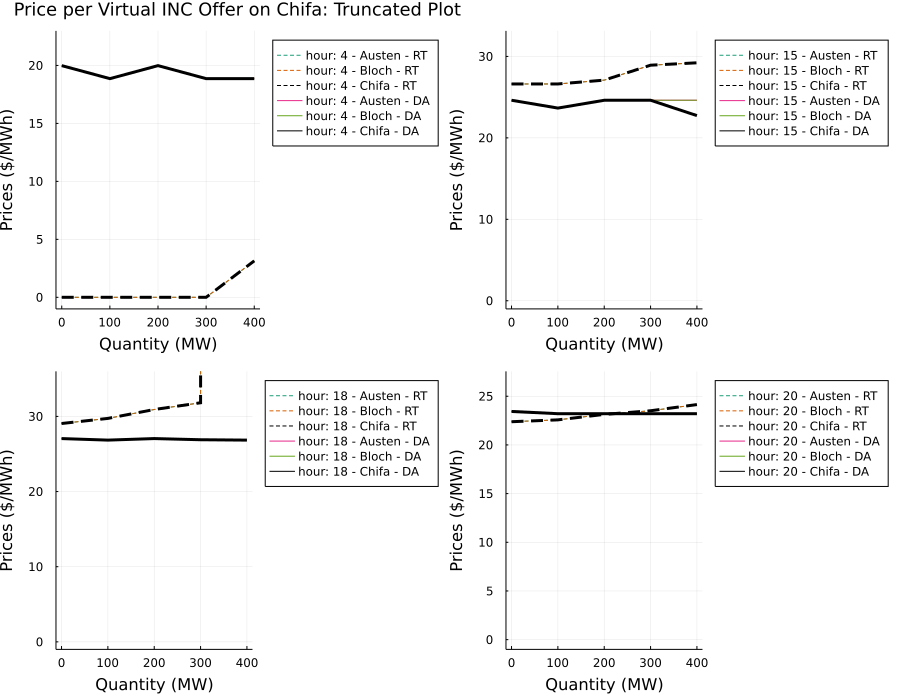

In [34]:
l = @layout grid(2,2)

plot(plt_p_t[6,1],plt_p_t[6,2],plt_p_t[6,3],plt_p_t[6,4],layout=l,size=(900,700),title=title=["                            Price per Virtual INC Offer on Chifa: Truncated Plot" "" "" ""], titlefont = font(12)) 

#### Generation in Austen when bidding in Austen

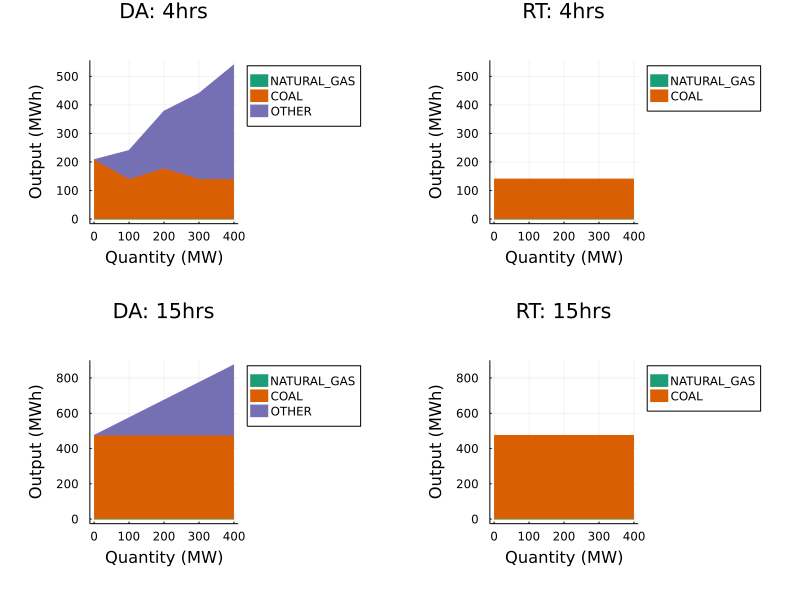

In [35]:
plot(plt_g_A[4,1,1], plt_g_A[4,1,2], plt_g_A[4,2,1], plt_g_A[4,2,2],layout=4,title=["DA: 4hrs" "RT: 4hrs" "DA: 15hrs" "RT: 15hrs"], link=:y, xtickfontsize=8, margin=8mm, size=(800, 600),)

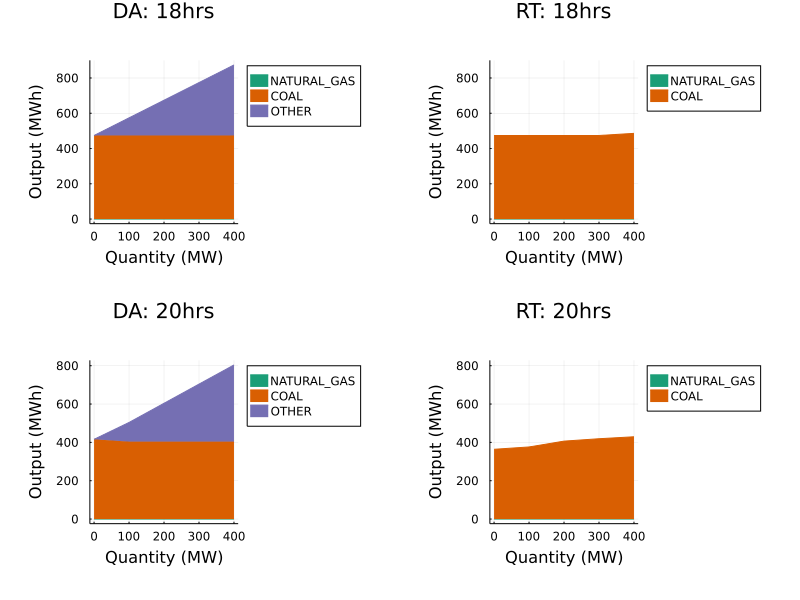

In [36]:
plot(plt_g_A[4,3,1], plt_g_A[4,3,2], plt_g_A[4,4,1], plt_g_A[4,4,2],layout=4,title=["DA: 18hrs" "RT: 18hrs" "DA: 20hrs" "RT: 20hrs"], link=:y, xtickfontsize=8, margin=8mm, size=(800, 600),)

#### Generation in Bloch when bidding in Bloch

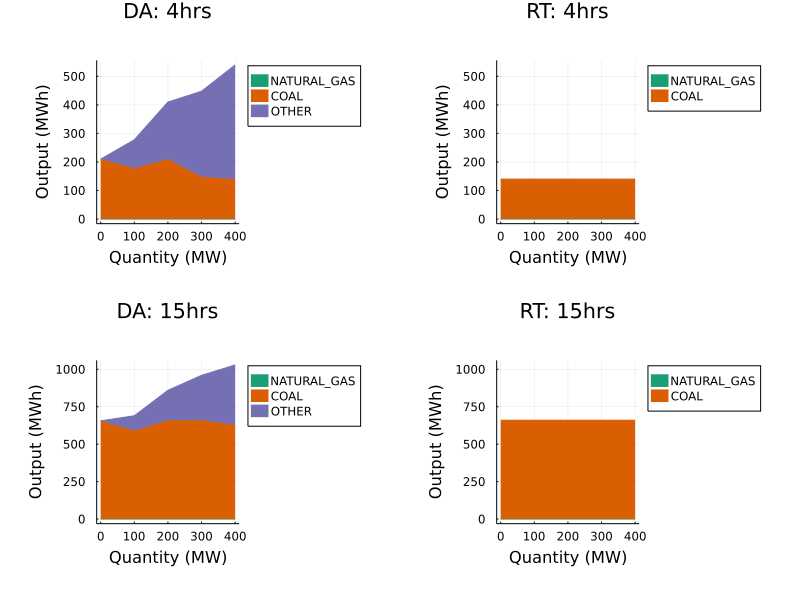

In [37]:
plot(plt_g_B[5,1,1], plt_g_B[5,1,2], plt_g_B[5,2,1], plt_g_B[5,2,2],layout=4,title=["DA: 4hrs" "RT: 4hrs" "DA: 15hrs" "RT: 15hrs"], link=:y, xtickfontsize=8, margin=8mm, size=(800, 600),)

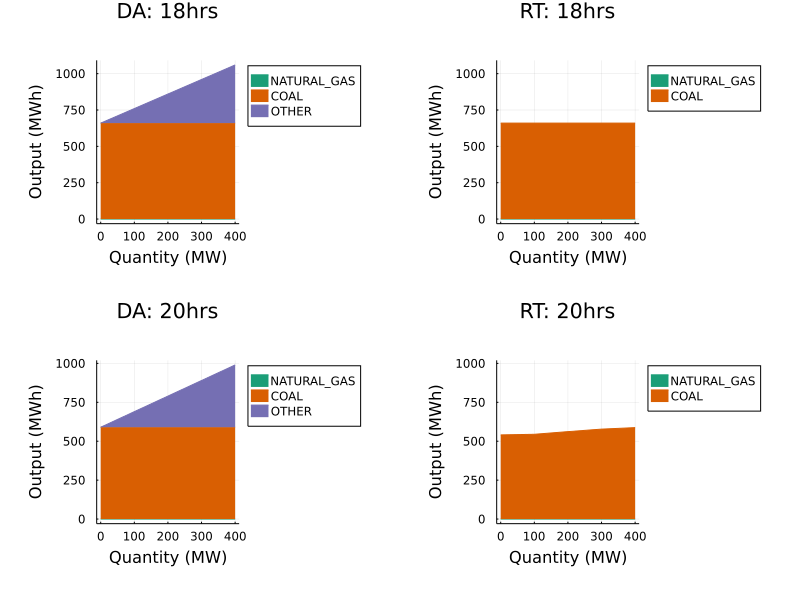

In [38]:
plot(plt_g_B[5,3,1], plt_g_B[5,3,2], plt_g_B[5,4,1], plt_g_B[5,4,2],layout=4,title=["DA: 18hrs" "RT: 18hrs" "DA: 20hrs" "RT: 20hrs"], link=:y, xtickfontsize=8, margin=8mm, size=(800, 600),)

#### Generation in Chifa when bidding in Chifa

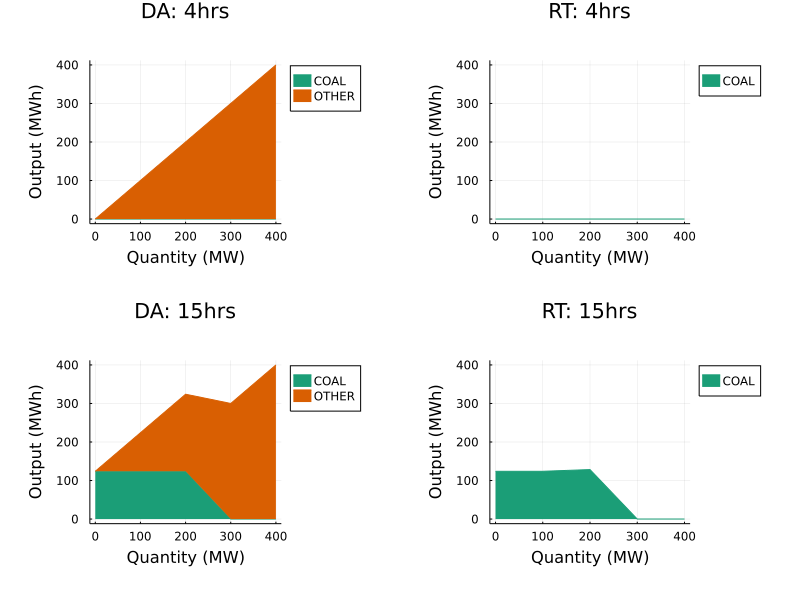

In [39]:
plot(plt_g_C[6,1,1], plt_g_C[6,1,2], plt_g_C[6,2,1], plt_g_C[6,2,2],layout=4,title=["DA: 4hrs" "RT: 4hrs" "DA: 15hrs" "RT: 15hrs"], link=:y, xtickfontsize=8, margin=8mm, size=(800, 600),)

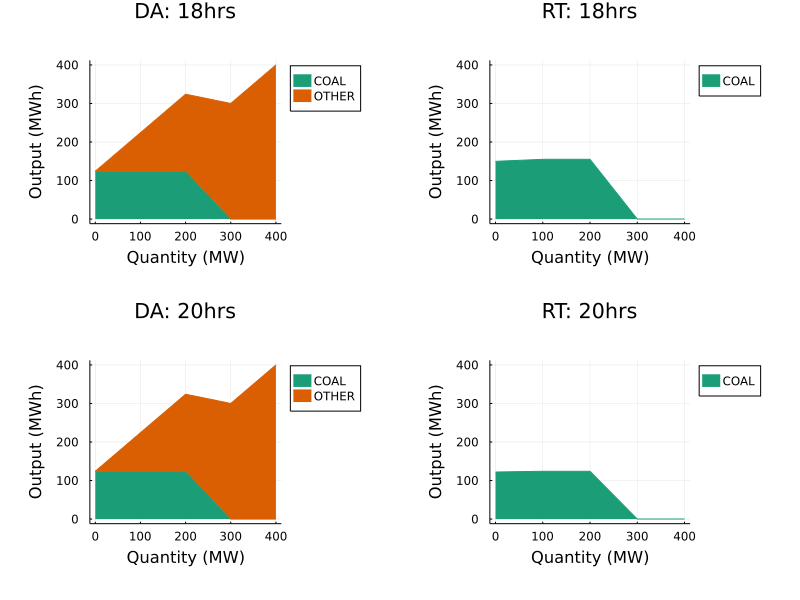

In [40]:
plot(plt_g_C[6,3,1], plt_g_C[6,3,2], plt_g_C[6,4,1], plt_g_C[6,4,2],layout=4,title=["DA: 18hrs" "RT: 18hrs" "DA: 20hrs" "RT: 20hrs"], link=:y, xtickfontsize=8, margin=8mm, size=(800, 600),)

### CASE3: CopperPlate

In [49]:
df[7:9,:]

,Network,Ramp
,Any,Any
1,"Dict(""RT""=>CopperPlatePowerModel, ""DA""=>CopperPlatePowerModel)","Dict(""RT""=>1, ""DA""=>1)"
2,"Dict(""RT""=>CopperPlatePowerModel, ""DA""=>CopperPlatePowerModel)","Dict(""RT""=>1, ""DA""=>1)"
3,"Dict(""RT""=>CopperPlatePowerModel, ""DA""=>CopperPlatePowerModel)","Dict(""RT""=>1, ""DA""=>1)"


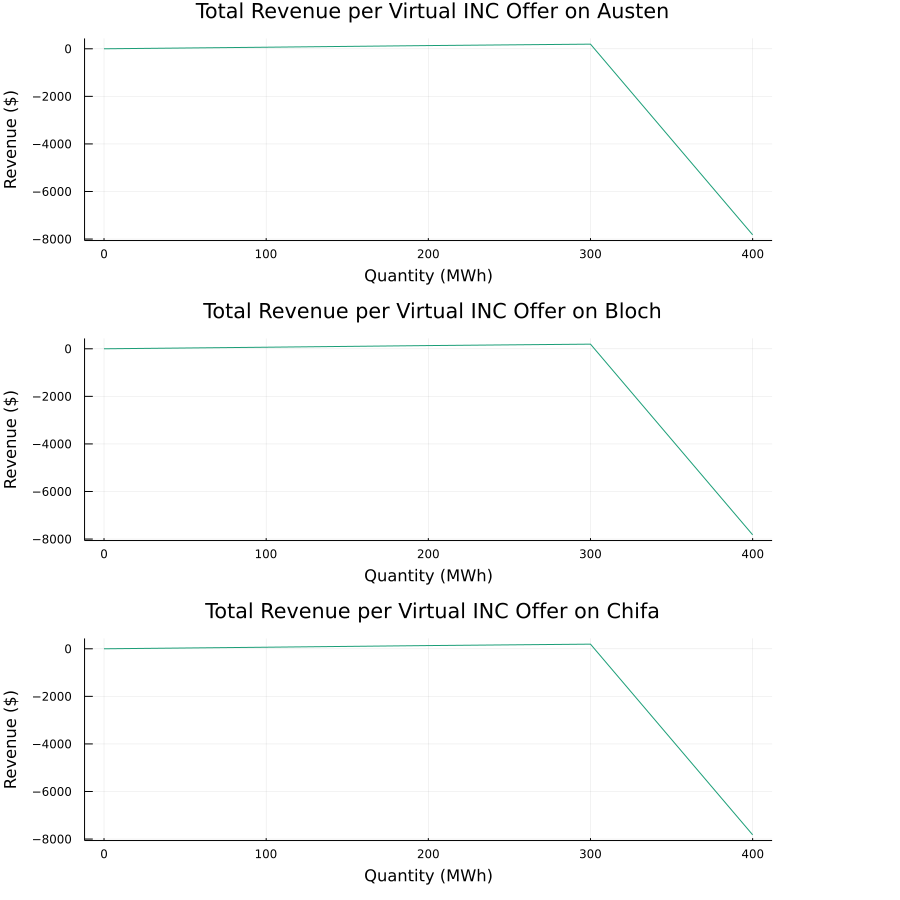

In [41]:
l = @layout grid(3,1)
plot(plt_sr_f[7], plt_sr_f[8], plt_sr_f[9], layout=l,size=(900,900))

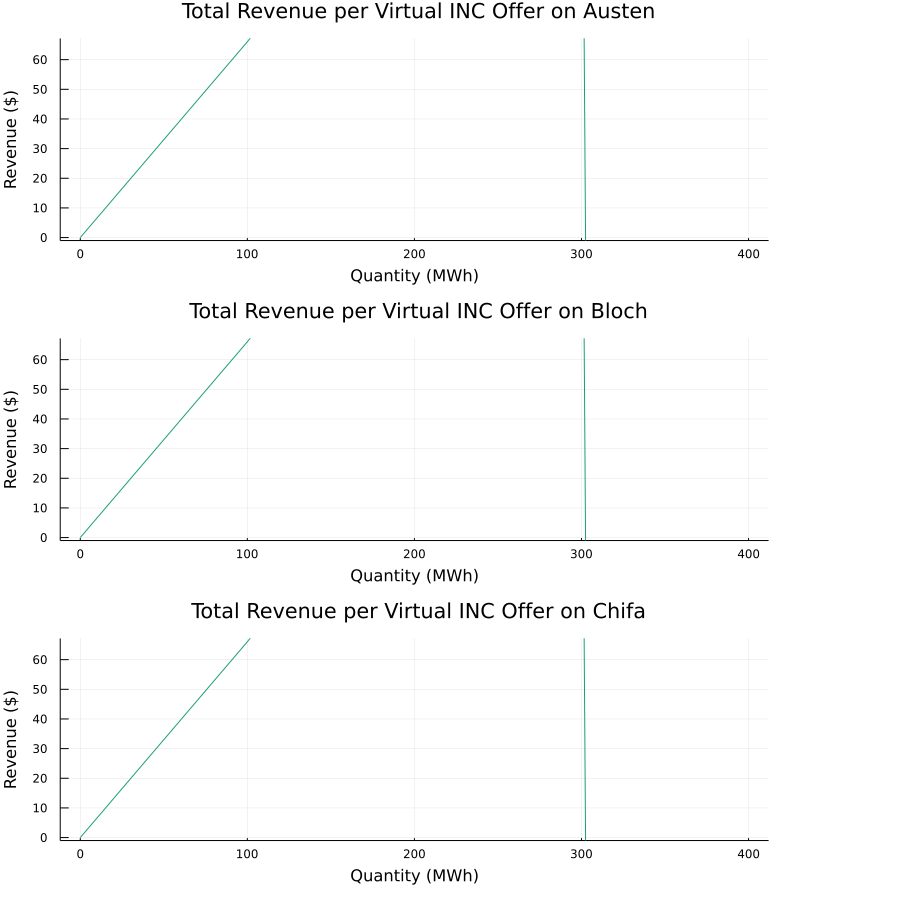

In [42]:
l = @layout grid(3,1)
plot(plt_sr[7], plt_sr[8], plt_sr[9], layout=l,size=(900,900))

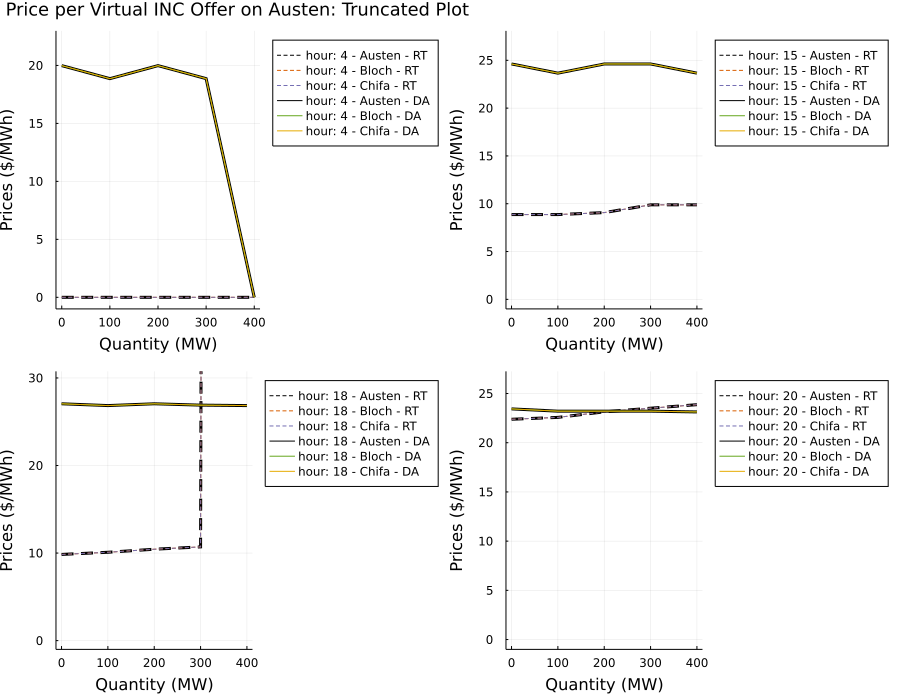

In [43]:
l = @layout grid(2,2)

plot(plt_p_t[7,1],plt_p_t[7,2],plt_p_t[7,3],plt_p_t[4,4],layout=l,size=(900,700),title=title=["                            Price per Virtual INC Offer on Austen: Truncated Plot" "" "" ""], titlefont = font(12)) 

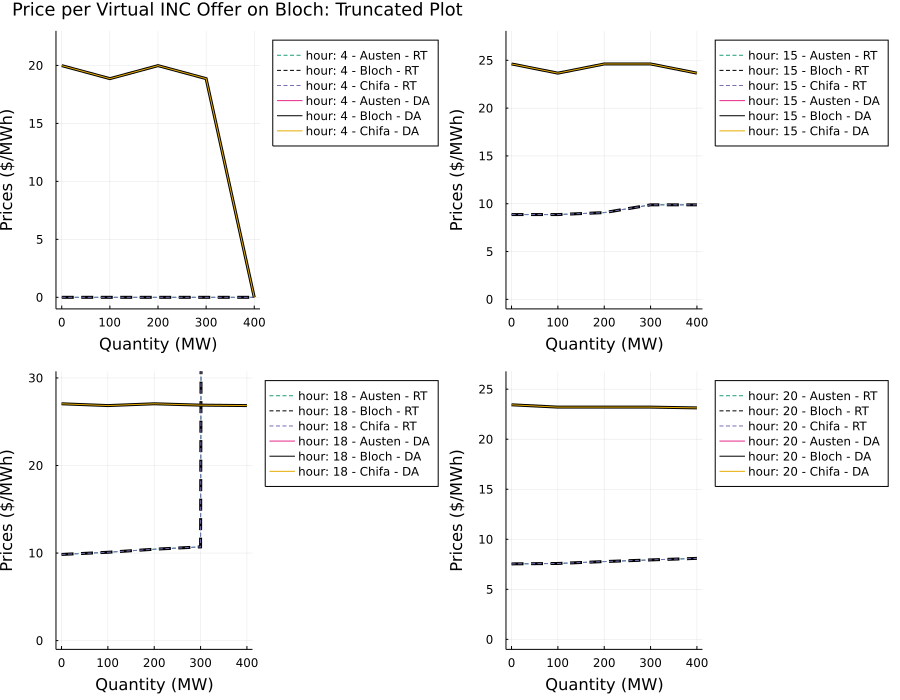

In [48]:
l = @layout grid(2,2)

plot(plt_p_t[8,1],plt_p_t[8,2],plt_p_t[8,3],plt_p_t[8,4],layout=l,size=(900,700),title=title=["                            Price per Virtual INC Offer on Bloch: Truncated Plot" "" "" ""], titlefont = font(12)) 

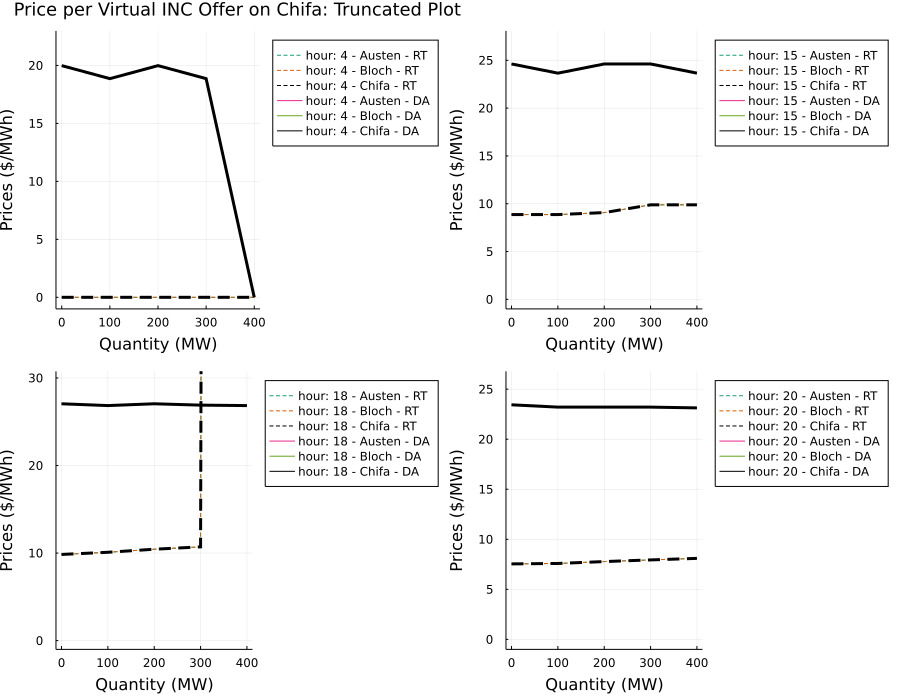

In [49]:
l = @layout grid(2,2)

plot(plt_p_t[9,1],plt_p_t[9,2],plt_p_t[9,3],plt_p_t[9,4],layout=l,size=(900,700),title=title=["                            Price per Virtual INC Offer on Chifa: Truncated Plot" "" "" ""], titlefont = font(12)) 

#### Generation in Austen when bidding in Austen

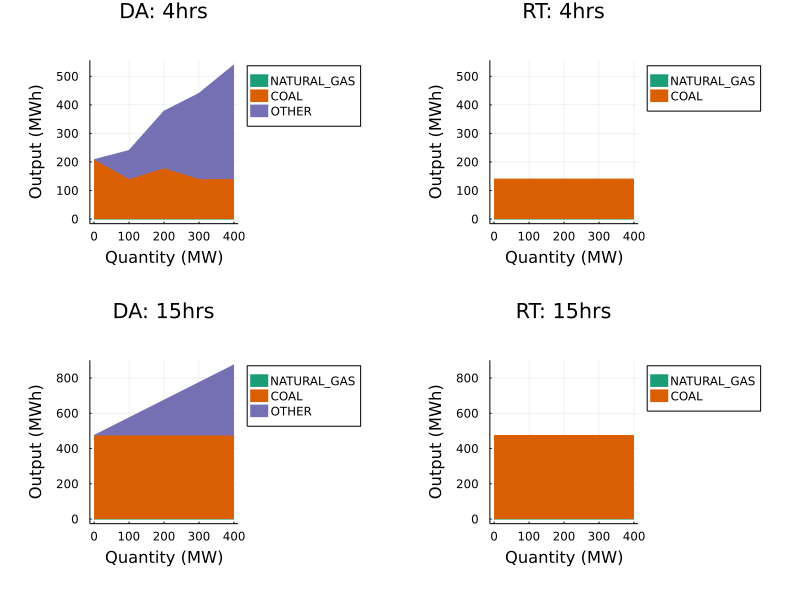

In [52]:
plot(plt_g_A[7,1,1], plt_g_A[7,1,2], plt_g_A[7,2,1], plt_g_A[7,2,2],layout=4,title=["DA: 4hrs" "RT: 4hrs" "DA: 15hrs" "RT: 15hrs"],link=:y, xtickfontsize=8, margin=8mm, size=(800, 600),)

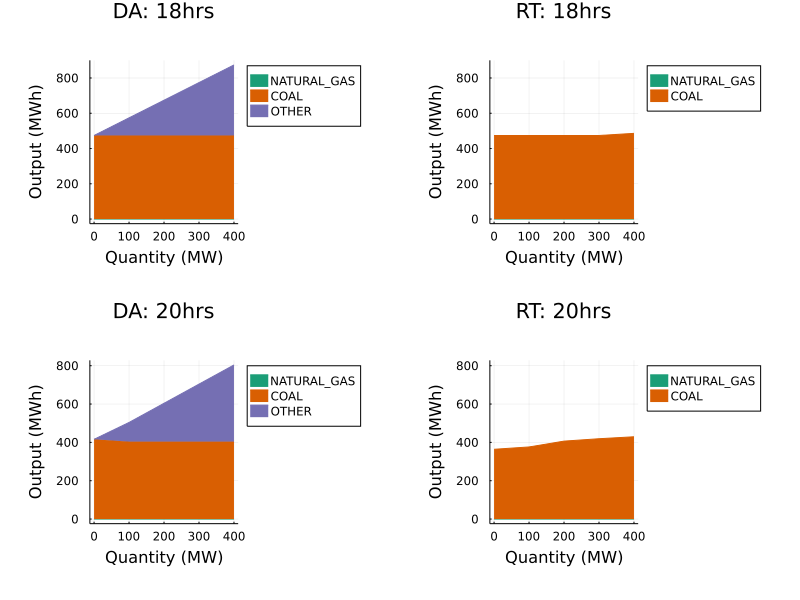

In [53]:
plot(plt_g_A[7,3,1], plt_g_A[7,3,2], plt_g_A[7,4,1], plt_g_A[7,4,2],layout=4,title=["DA: 18hrs" "RT: 18hrs" "DA: 20hrs" "RT: 20hrs"], link=:y, xtickfontsize=8, margin=8mm, size=(800, 600),)

#### Generation in Bloch when bidding in Bloch

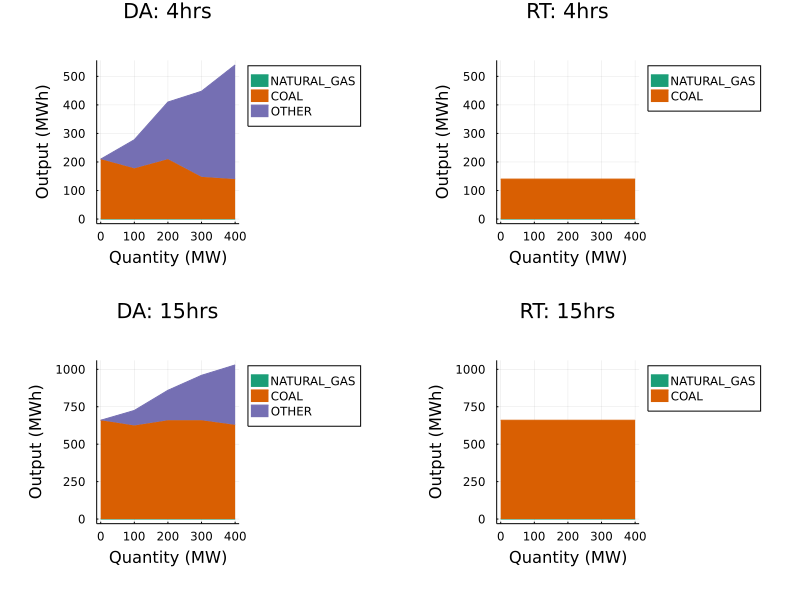

In [54]:
plot(plt_g_B[8,1,1], plt_g_B[8,1,2], plt_g_B[8,2,1], plt_g_B[8,2,2],layout=4,title=["DA: 4hrs" "RT: 4hrs" "DA: 15hrs" "RT: 15hrs"], link=:y, xtickfontsize=8, margin=8mm, size=(800, 600),)

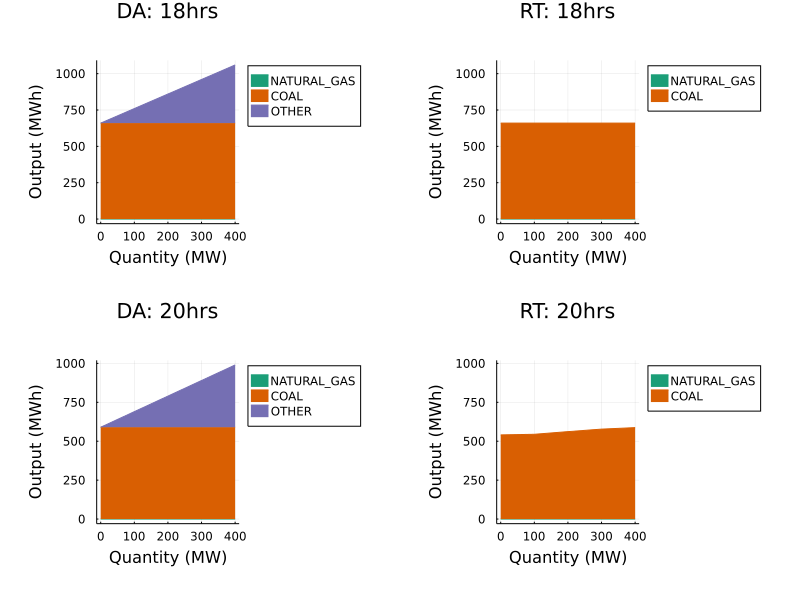

In [57]:
plot(plt_g_B[8,3,1], plt_g_B[8,3,2], plt_g_B[8,4,1], plt_g_B[8,4,2],layout=4,title=["DA: 18hrs" "RT: 18hrs" "DA: 20hrs" "RT: 20hrs"], link=:y, xtickfontsize=8, margin=8mm, size=(800, 600),)

#### Generation in Chifa when bidding in Chifa

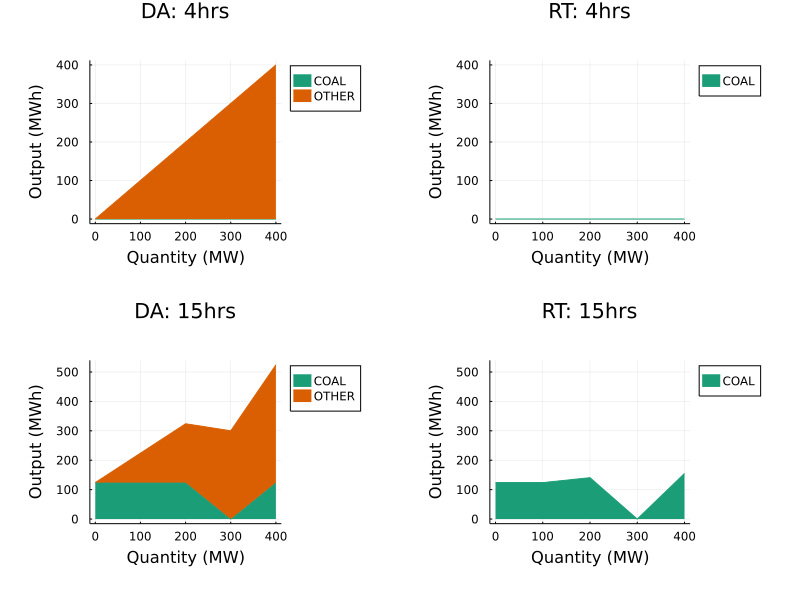

In [58]:
plot(plt_g_C[9,1,1], plt_g_C[9,1,2], plt_g_C[9,2,1], plt_g_C[9,2,2],layout=4,title=["DA: 4hrs" "RT: 4hrs" "DA: 15hrs" "RT: 15hrs"], link=:y, xtickfontsize=8, margin=8mm, size=(800, 600),)

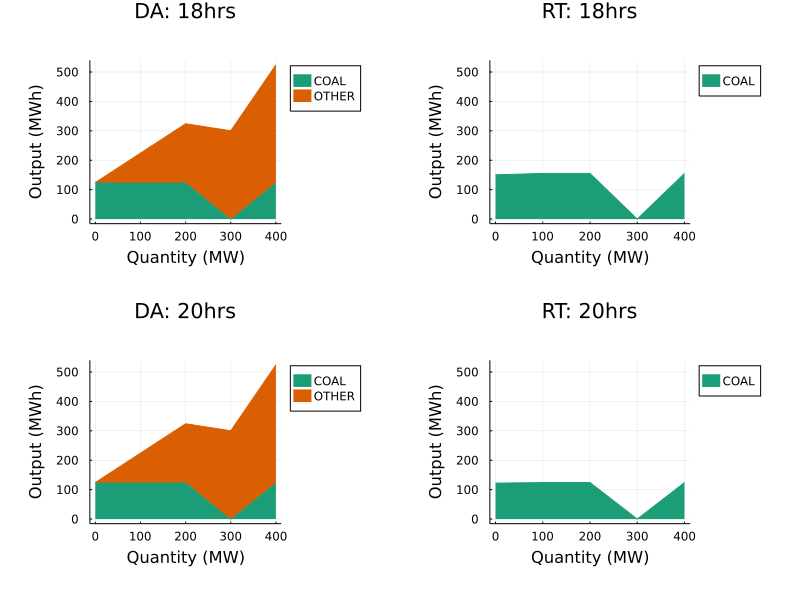

In [59]:
plot(plt_g_C[9,3,1], plt_g_C[9,3,2], plt_g_C[9,4,1], plt_g_C[9,4,2],layout=4,title=["DA: 18hrs" "RT: 18hrs" "DA: 20hrs" "RT: 20hrs"], link=:y, xtickfontsize=8, margin=8mm, size=(800, 600),)

##  System capacities analysis

### CASE4: Minimum generation false 

In [63]:
df[10:12,:]

,Network,Ramp,Minimal_generation
,Any,Any,Any
1,"Dict(""RT""=>DCPPowerModel, ""DA""=>DCPPowerModel)","Dict(""RT""=>1, ""DA""=>1)","Dict(""RT""=>0, ""DA""=>0)"
2,"Dict(""RT""=>DCPPowerModel, ""DA""=>DCPPowerModel)","Dict(""RT""=>1, ""DA""=>1)","Dict(""RT""=>0, ""DA""=>0)"
3,"Dict(""RT""=>DCPPowerModel, ""DA""=>DCPPowerModel)","Dict(""RT""=>1, ""DA""=>1)","Dict(""RT""=>0, ""DA""=>0)"


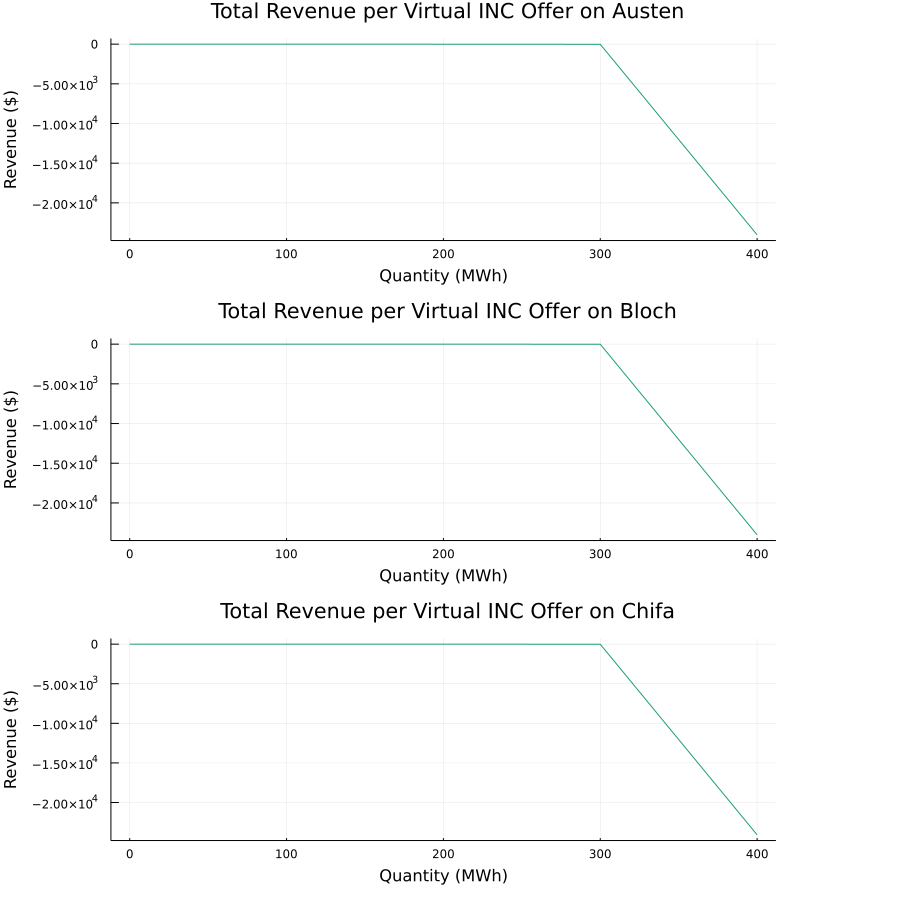

In [66]:
l = @layout grid(3,1)
plot(plt_sr_f[10], plt_sr_f[11], plt_sr_f[12], layout=l,size=(900,900))

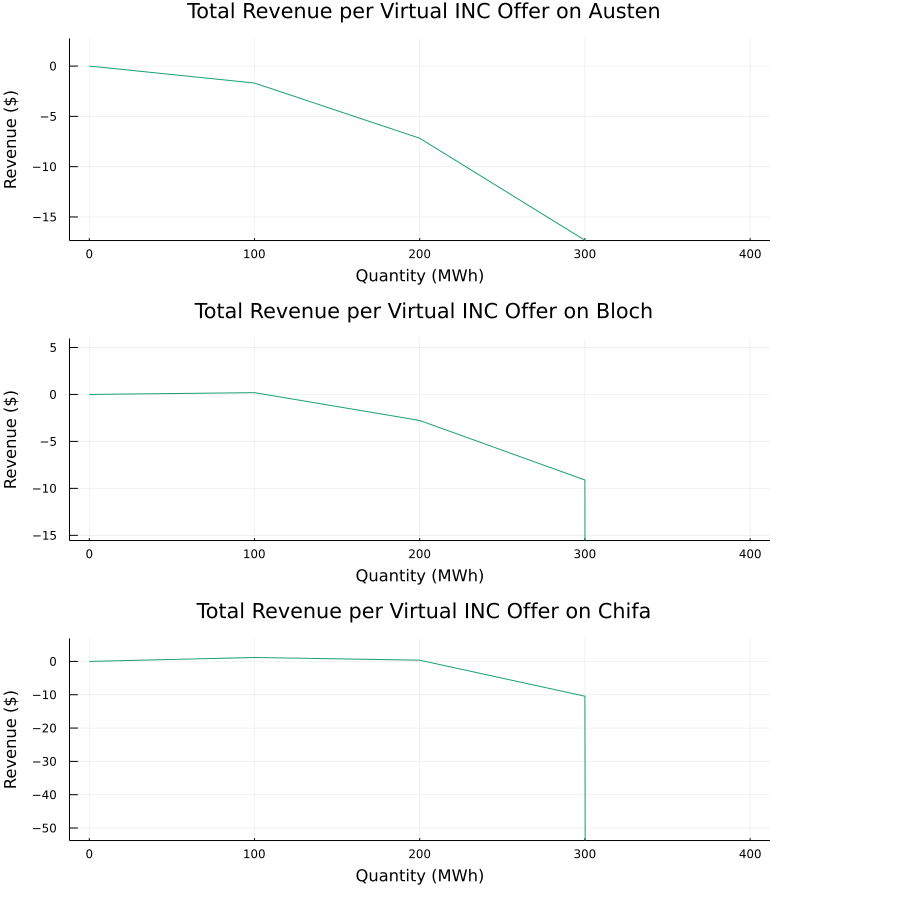

In [67]:
l = @layout grid(3,1)
plot(plt_sr[10], plt_sr[11], plt_sr[12], layout=l,size=(900,900))

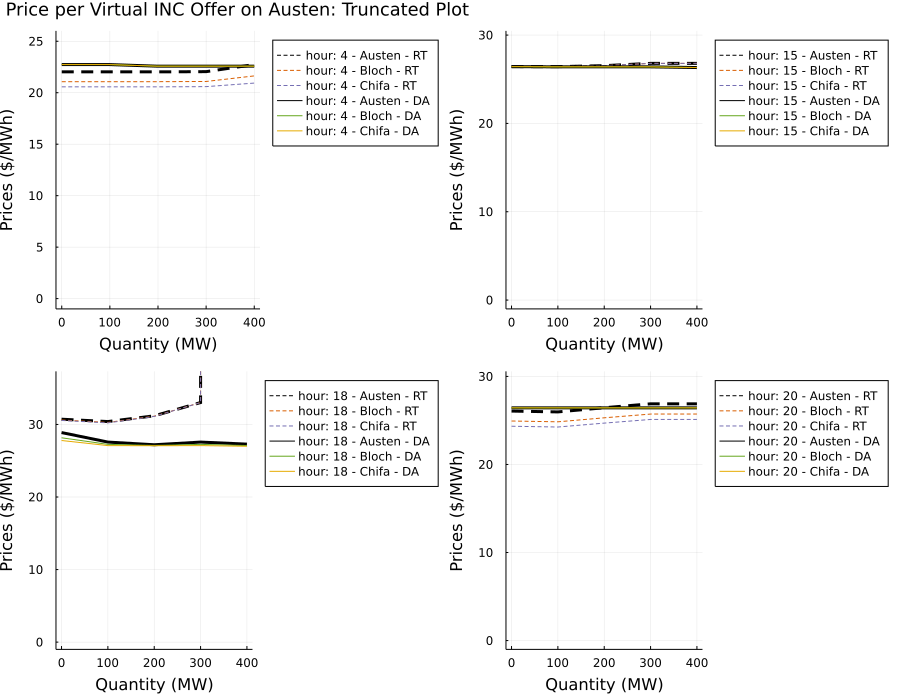

In [68]:
l = @layout grid(2,2)

plot(plt_p_t[10,1],plt_p_t[10,2],plt_p_t[10,3],plt_p_t[10,4],layout=l,size=(900,700),title=title=["                            Price per Virtual INC Offer on Austen: Truncated Plot" "" "" ""], titlefont = font(12)) 

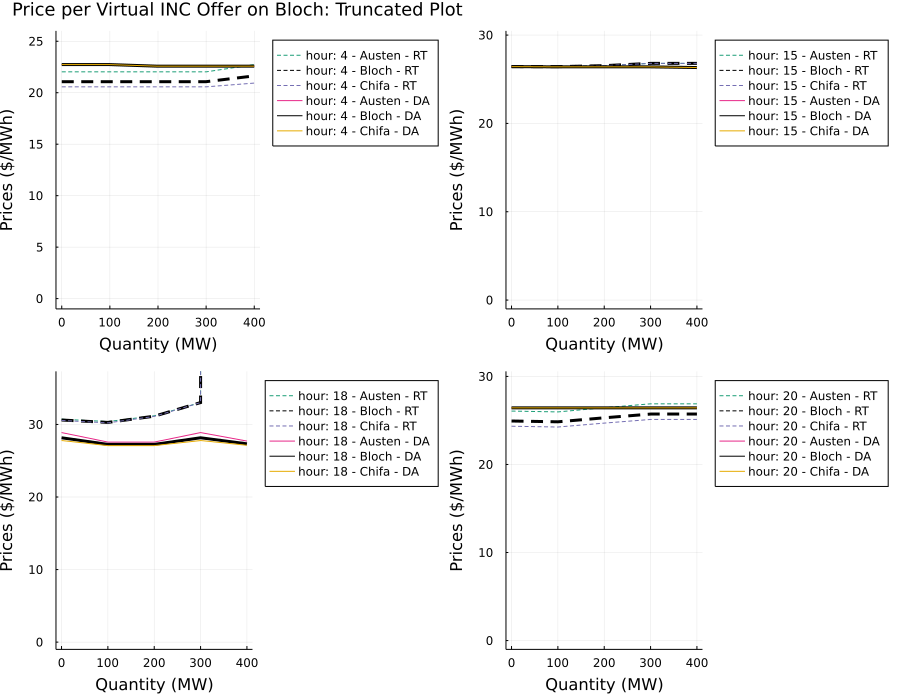

In [73]:
l = @layout grid(2,2)

plot(plt_p_t[11,1],plt_p_t[11,2],plt_p_t[11,3],plt_p_t[11,4],layout=l,size=(900,700),title=title=["                            Price per Virtual INC Offer on Bloch: Truncated Plot" "" "" ""], titlefont = font(12)) 

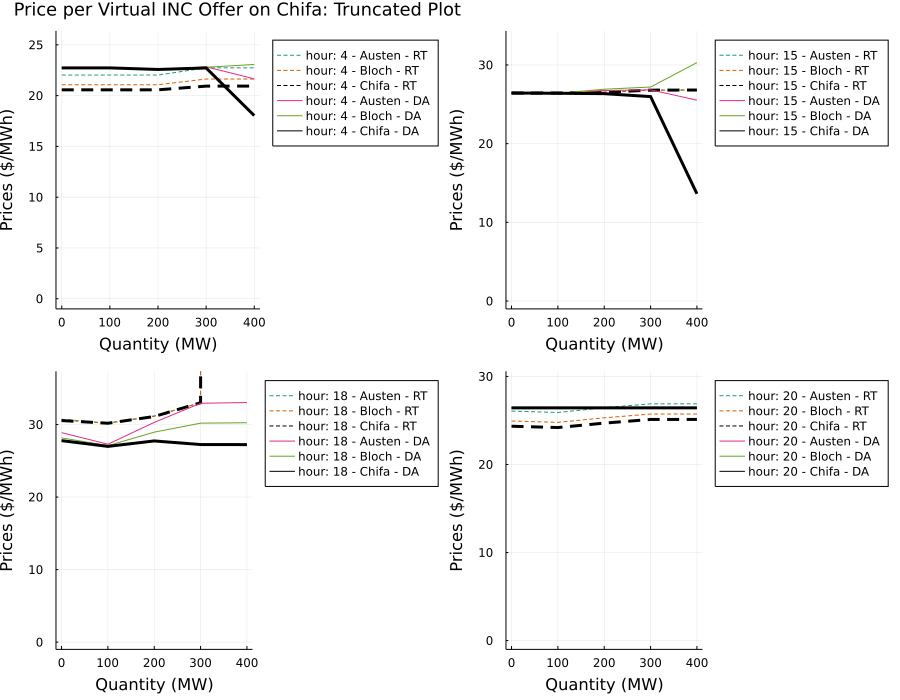

In [74]:
l = @layout grid(2,2)

plot(plt_p_t[12,1],plt_p_t[12,2],plt_p_t[12,3],plt_p_t[12,4],layout=l,size=(900,700),title=title=["                            Price per Virtual INC Offer on Chifa: Truncated Plot" "" "" ""], titlefont = font(12)) 

#### Generation in Austen when bidding in Austen

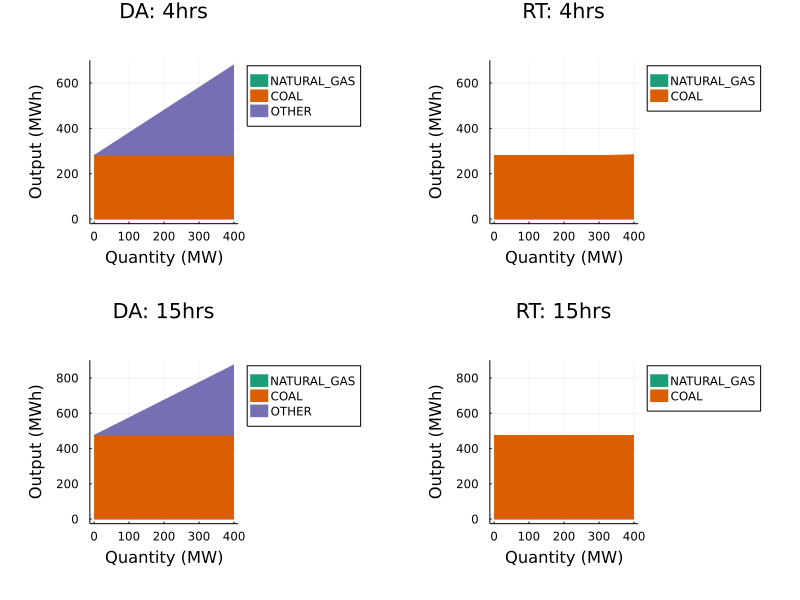

In [77]:
plot(plt_g_A[10,1,1], plt_g_A[10,1,2], plt_g_A[10,2,1], plt_g_A[10,2,2],layout=4,title=["DA: 4hrs" "RT: 4hrs" "DA: 15hrs" "RT: 15hrs"], link=:y, xtickfontsize=8, margin=8mm, size=(800, 600),)

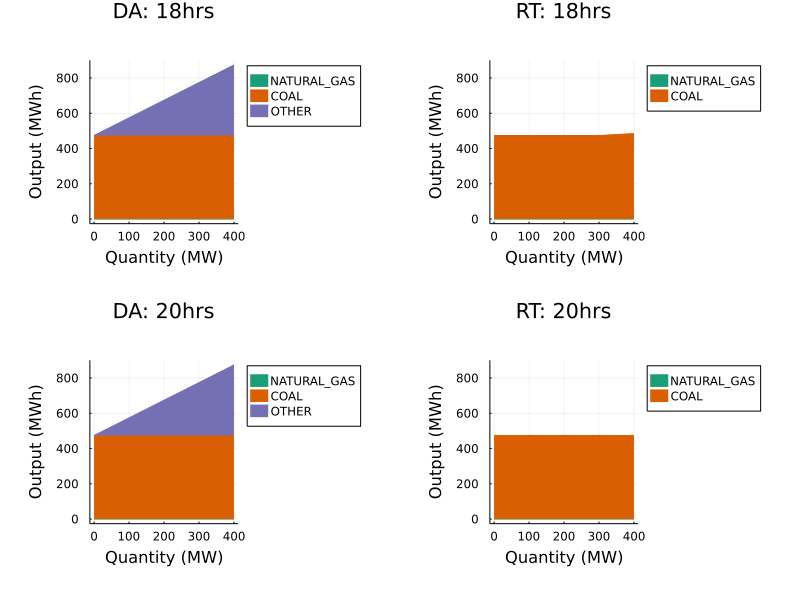

In [78]:
plot(plt_g_A[10,3,1], plt_g_A[10,3,2], plt_g_A[10,4,1], plt_g_A[10,4,2],layout=4,title=["DA: 18hrs" "RT: 18hrs" "DA: 20hrs" "RT: 20hrs"], link=:y, xtickfontsize=8, margin=8mm, size=(800, 600),)

#### Generation in Bloch when bidding in Bloch

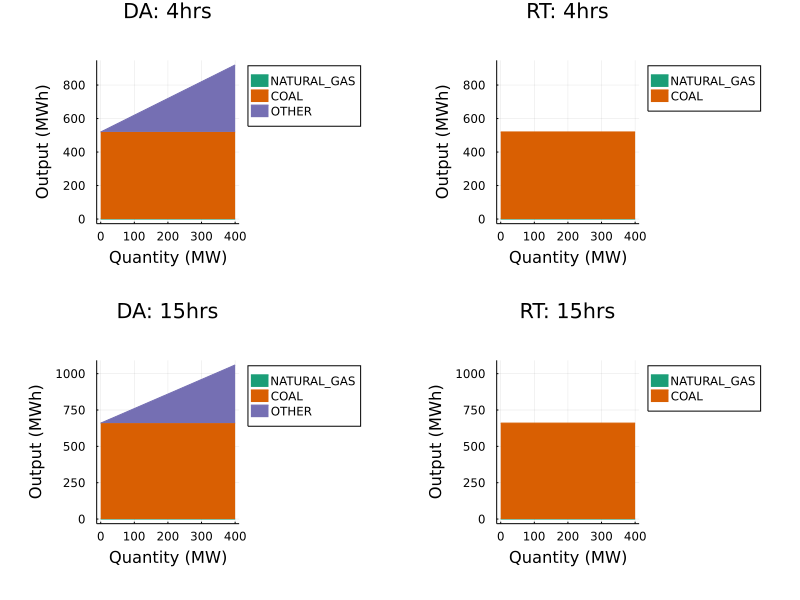

In [79]:
plot(plt_g_B[11,1,1], plt_g_B[11,1,2], plt_g_B[11,2,1], plt_g_B[11,2,2],layout=4,title=["DA: 4hrs" "RT: 4hrs" "DA: 15hrs" "RT: 15hrs"], link=:y, xtickfontsize=8, margin=8mm, size=(800, 600),)

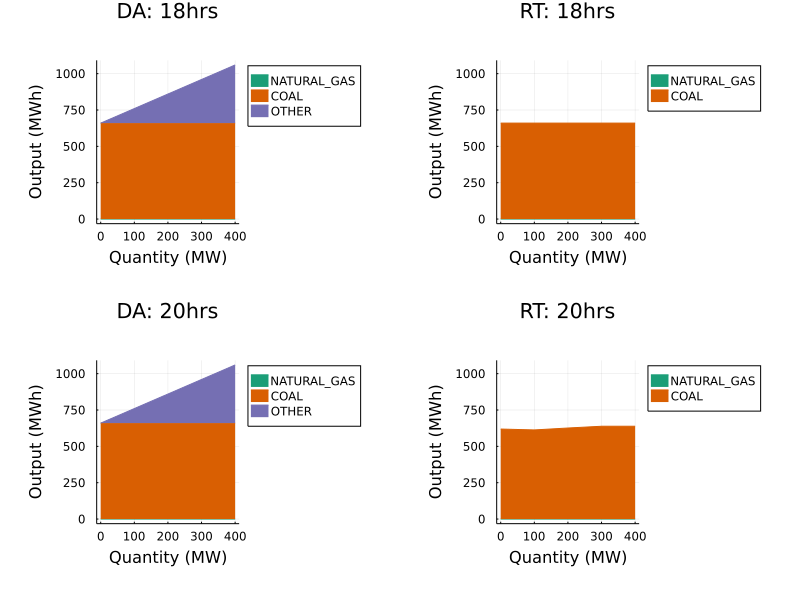

In [82]:
plot(plt_g_B[11,3,1], plt_g_B[11,3,2], plt_g_B[11,4,1], plt_g_B[11,4,2],layout=4,title=["DA: 18hrs" "RT: 18hrs" "DA: 20hrs" "RT: 20hrs"], link=:y, xtickfontsize=8, margin=8mm, size=(800, 600),)

#### Generation in Chifa when bidding in Chifa

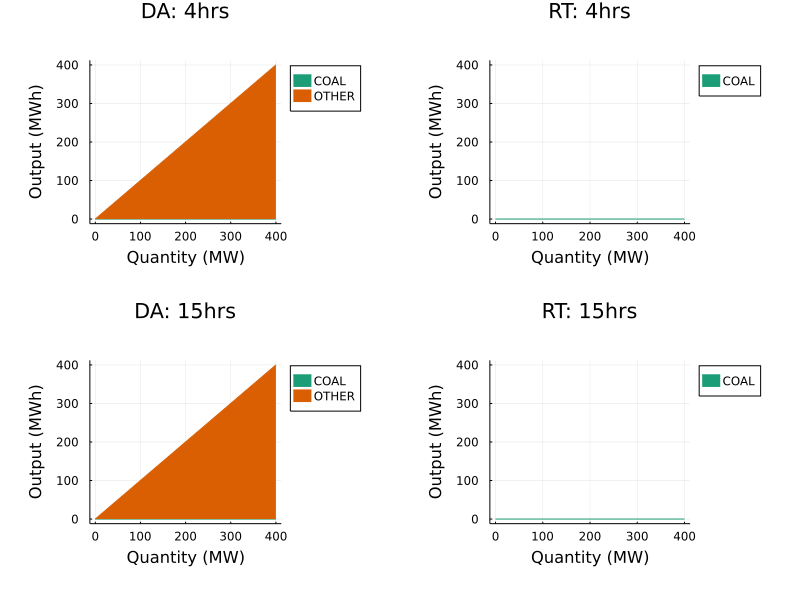

In [83]:
plot(plt_g_C[12,1,1], plt_g_C[12,1,2], plt_g_C[12,2,1], plt_g_C[12,2,2],layout=4,title=["DA: 4hrs" "RT: 4hrs" "DA: 15hrs" "RT: 15hrs"], link=:y, xtickfontsize=8, margin=8mm, size=(800, 600),)

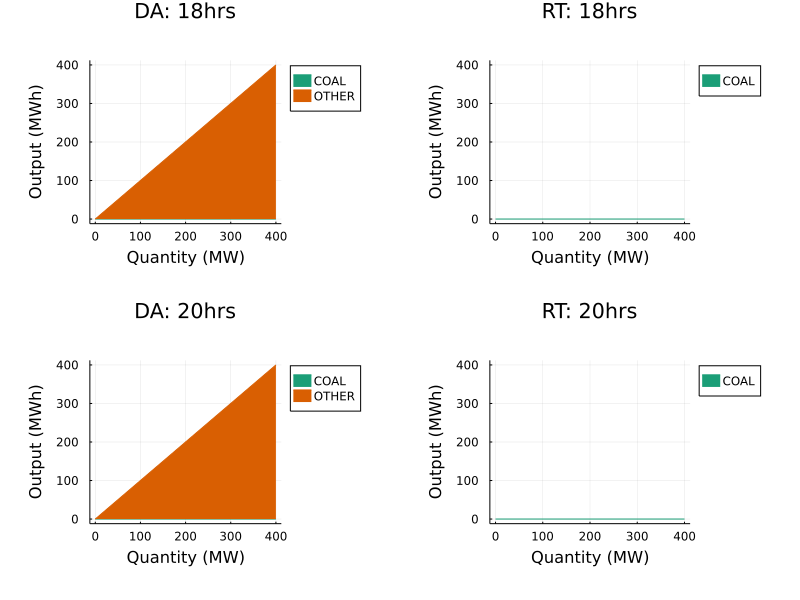

In [84]:
plot(plt_g_C[12,3,1], plt_g_C[12,3,2], plt_g_C[12,4,1], plt_g_C[12,4,2],layout=4,title=["DA: 18hrs" "RT: 18hrs" "DA: 20hrs" "RT: 20hrs"], link=:y, xtickfontsize=8, margin=8mm, size=(800, 600),)